In [1]:
import matplotlib.pyplot as plt
import numpy

from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


Tasks #1. Segmentation
Try segmentation for green-samples obtained with: [scanner], [sepcim IQ] and [tunable]. You must select an example spectrum from the image and try to select all similar spectra in the image. Either like we did on lecture or develop you own method. 


First for the Scanner

In [2]:
# read dir and search for WHITE, DARK and OBJECT (RAW and HDR)
import os
def readDir(dir_path):
    myDir = os.listdir(dir_path)
    dark_hdr =[]
    dark_raw=[]
    white_hdr=[]
    white_raw=[]
    for file in myDir:
        if 'dark' in file.lower() and 'hdr' in file.lower():
            #dark_hdr = dir_path + '/' + file
            dark_hdr = os.path.join(dir_path, file)
        if 'dark' in file.lower() and 'raw' in file.lower():
            #dark_raw = dir_path + '/' + file
            dark_raw = os.path.join(dir_path, file)
        if 'white' in file.lower() and 'hdr' in file.lower():
            #white_hdr = dir_path + '/' + file
            white_hdr = os.path.join(dir_path, file)
        if 'white' in file.lower() and 'raw' in file.lower():
            #white_raw = dir_path + '/' + file
            white_raw = os.path.join(dir_path, file)
        if (not 'white' in file.lower()) and (not 'dark' in file.lower()) and 'hdr' in file.lower():
            #object_hdr = dir_path + '/' + file
            object_hdr = os.path.join(dir_path, file)
        if (not 'white' in file.lower()) and (not 'dark' in file.lower()) and 'raw' in file.lower():
            #object_raw = dir_path + '/' + file
            object_raw = os.path.join(dir_path, file)
    return object_raw, object_hdr, white_raw, white_hdr, dark_raw, dark_hdr  
import os
import numpy

##### Read HDR content
def read_hdr(hdr_path):
    f=open(hdr_path, "r")
    filelines = f.readlines()
    #print(filelines)
    f.close()
    bands = ''
    for fileline in filelines:
        #print(fileline)
        if 'samples' in fileline.lower():
            samples = int(fileline.replace('samples = ',''))
            print(samples)
        if bands =='' and 'bands' in fileline.lower():
            bands = int(fileline.replace('bands = ',''))
        if 'lines' in fileline.lower():
            lines = int(fileline.replace('lines = ',''))
    # read waves   
    print(samples, lines, bands)
    n = 0
    for fileline in filelines:
        if 'th = {' in fileline.lower():
          print(n)
          n1 = n+1
        n = n + 1
    n2 = n1 + bands
    print(n1)
    print(n2)
    waves = numpy.zeros(n2-n1,)
    n = 0
    for i in range(n1, n2):
        #print(filelines[i])
        waves[n] = float(filelines[i].replace(',',''))
        #print(waves[n])
        n = n + 1
    
    return samples, bands, lines, waves     




'path' is a path to 'capture' folder
the code reads 'spectral_image'

In [ ]:
# Read hdr
path = "/content/drive/MyDrive/Group3 session 2/[scanner]/vis_green_samples/capture"

[object_raw, object_hdr, white_raw, white_hdr, dark_raw, dark_hdr ] = readDir(path)
print(object_raw)
samples = 512 
[samples, bands, lines, waves] = read_hdr(object_hdr)

open_path = object_raw
# Read raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
spectral_image = numpy.reshape(raw_image, (lines, bands, samples))
print('spectral_image.shape: ', spectral_image.shape)

/content/drive/MyDrive/Group3 session 2/[scanner]/vis_green_samples/capture/vis_scan_0069.raw
2144
2144 3173 135
54
55
190
spectral_image.shape:  (3173, 135, 2144)


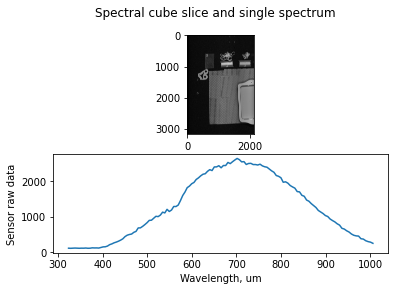

In [ ]:
# Plot picture and spectrum
fig, axs = plt.subplots(2)
fig.suptitle('Spectral cube slice and single spectrum')
axs[0].imshow(spectral_image[:,100,:], cmap="gray", vmin=0, vmax=40700)#
axs[1].plot(waves, spectral_image[100,:,100])#
plt.xlabel('Wavelength, um')
plt.ylabel('Sensor raw data')
plt.rcParams['figure.dpi'] = 300
plt.show()

White correction
Read White and Dark

/content/drive/MyDrive/Group3 session 2/[scanner]/vis_green_samples/capture/WHITEREF_vis_scan_0069.hdr
2144
2144 151 135
54
55
190
2144 135 151


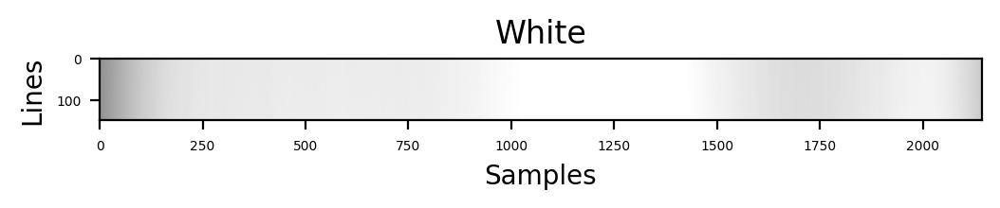

2144
2144 100 135
54
55
190


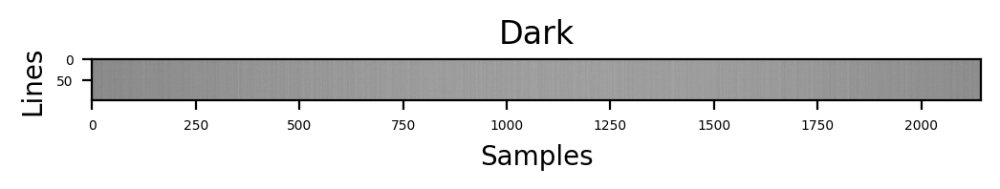

In [ ]:
# Read White
print(white_hdr)
[samples, bands, lines, waves] = read_hdr(white_hdr)
print(samples, bands, lines)
open_path = white_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
white_image = numpy.reshape(raw_image, (lines, bands, samples))/lines
plt.rcParams['figure.dpi'] = 200
plt.imshow(white_image[:,100,:], cmap="gray", vmin=0, vmax=250)#
plt.title("White")
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()
###############################################
# Read Dark
[samples, bands, lines, waves] = read_hdr(dark_hdr)
open_path = dark_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
dark_image = numpy.reshape(raw_image, (lines, bands, samples))/lines

plt.rcParams['figure.dpi'] = 200
plt.imshow(dark_image[:,100,:], cmap="gray", vmin=0, vmax=2)#
plt.title("Dark")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.show()


In [ ]:
# Calculate average for Dark and White

# Spectral_cube = upper_part/lower_part
# upper_part = spectral_image-dark
# lower_part = white - dark

white_av = numpy.sum(white_image, axis = 0) # get average for White
#print(white_image.shape)
#print(white_av.shape)
dark_av = numpy.sum(dark_image, axis = 0) # get average for White
#print(dark_image.shape)
#print(dark_av.shape)

[lines, bansd, samples] = spectral_image.shape
print(spectral_image.shape)
upper_part = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
spectral_cube = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
# Subtract [image - dark]
for i in range(lines):
  upper_part[i,:,:] = numpy.subtract(spectral_image[i,:,:], dark_av) 
# Subtract [white - dark]
lower_part = numpy.subtract(white_av, dark_av) 
# Subtract [image - dark]
for i in range(lines):
  spectral_cube[i,:,:] = numpy.divide(upper_part[i,:,:], lower_part)
# spectral_cube[:,:,:]  a white corrected spectral cube


(3173, 135, 2144)


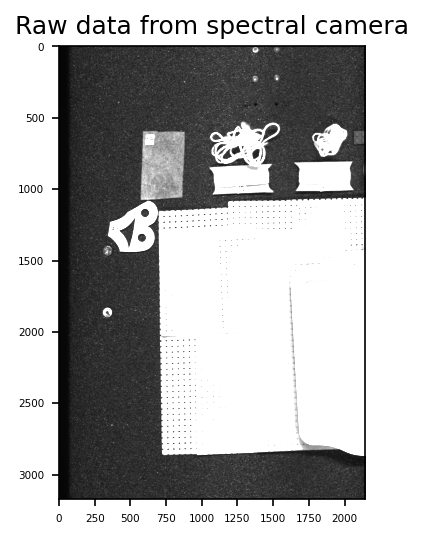

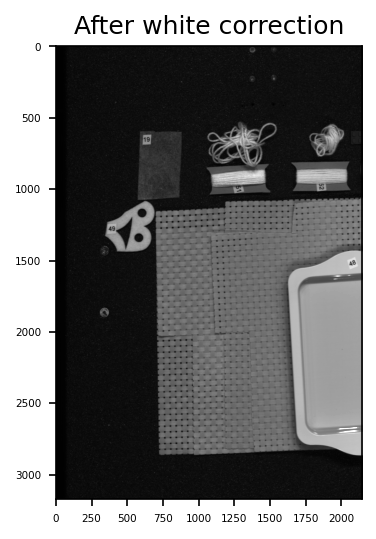

In [ ]:
# Plot results before and after white correction
plt.rcParams['figure.dpi'] = 150
plt.imshow(spectral_image[:,100,:], cmap="gray", vmin=0, vmax=10050)#
plt.title("Raw data from spectral camera")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()
plt.imshow(spectral_cube[:,100,:], cmap="gray", vmin=0, vmax= 1)#
plt.title("After white correction")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()




645.55
529.72
435.69


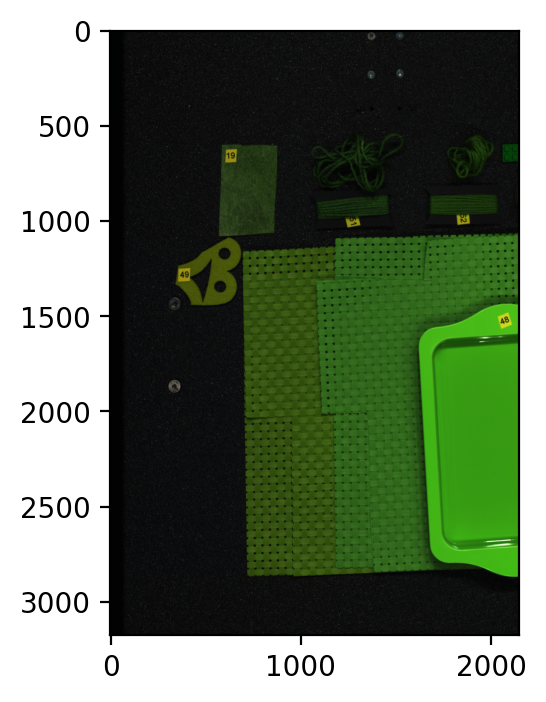

In [ ]:
# Show RGB image
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
RGB = numpy.empty((lines, samples, 3), dtype=numpy.float32)
ch_1 = 65
ch_2 = 42
ch_3 = 23
print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])
#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = spectral_cube[:,ch_1,:]
RGB[:,:,1] = spectral_cube[:,ch_2,:]
RGB[:,:,2] = spectral_cube[:,ch_3,:]
plt.rcParams['figure.dpi'] = 200
plt.imshow(RGB)

plt.show()

[0.05190336 0.04913296 0.06315349]


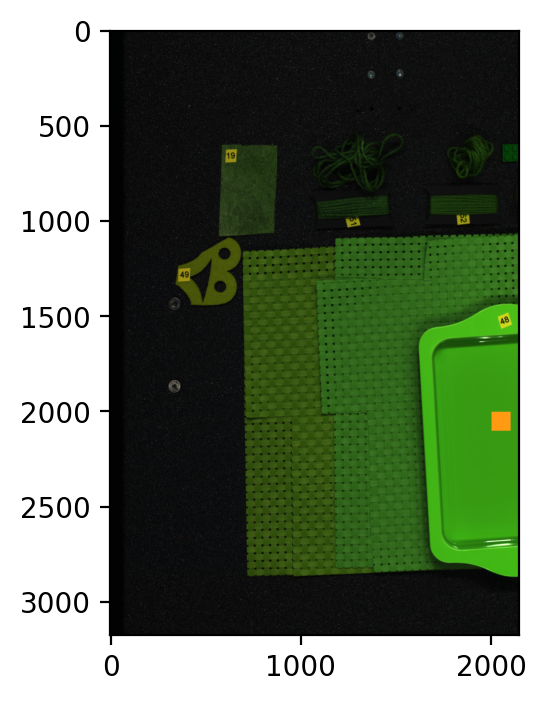

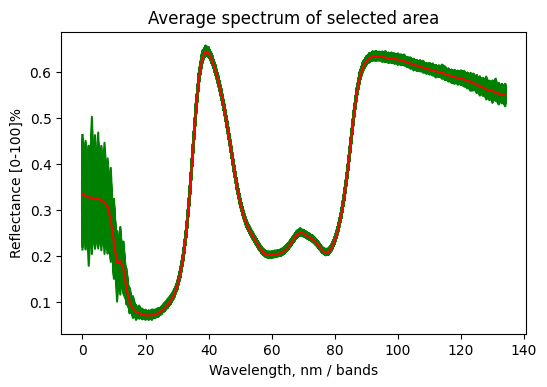

In [ ]:
# Selct area and plot its avearage spectrum
print(RGB[100,100,:])
RGB2 = RGB.copy()
##################################################################

# Sample 19
x1 = 2000
x2 = 2100
y1 = 2000
y2 = 2100

plt.rcParams['figure.dpi'] = 200

RGB2[x1:x2,y1:y2,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
#print(spectral_cube.shape)
#print(plastic.shape)

sel1 = numpy.sum(sel, axis = 0)
#print(pl1.shape)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
#print(pl2.shape)

##################################################################

plt.imshow(RGB2)
plt.rcParams['figure.dpi'] = 100
plt.show()

for i in range(20):
  plt.plot(sel[i,:,], 'g') #plt.plot(waves,selection1)

plt.plot(selection1, 'r') #plt.plot(waves,selection1)
plt.xlabel('Wavelength, nm / bands')
plt.ylabel('Reflectance [0-100]%')
plt.title("Average spectrum of selected area")


plt.show()

# save 
saveraw = "/content/drive/MyDrive/mushrom_image0001.raw"
fileobj = open(saveraw, mode='wb')
selection1.tofile(fileobj)
fileobj.close()




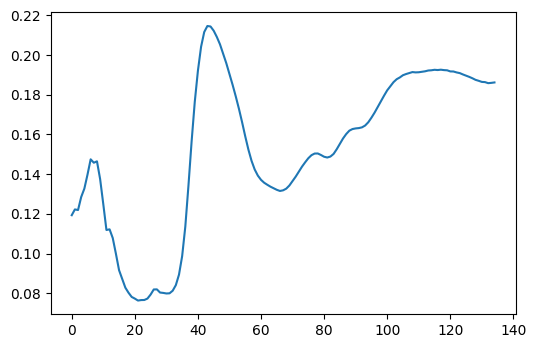

In [ ]:
open_path = "/content/drive/MyDrive/mushrom_image0001.raw"
fopen = open(open_path, "rb")
mushroom = numpy.fromfile(fopen, dtype=numpy.float32) 
fopen.close()
plt.plot(mushroom)
plt.show()

3173 135 2144
20
40
70
100
120
RGB:  (3173, 2144, 3)
cube:  (3173, 135, 2144)
small cube:  (3173, 2144, 5)


2.0383184
1.6114146
2.0065043


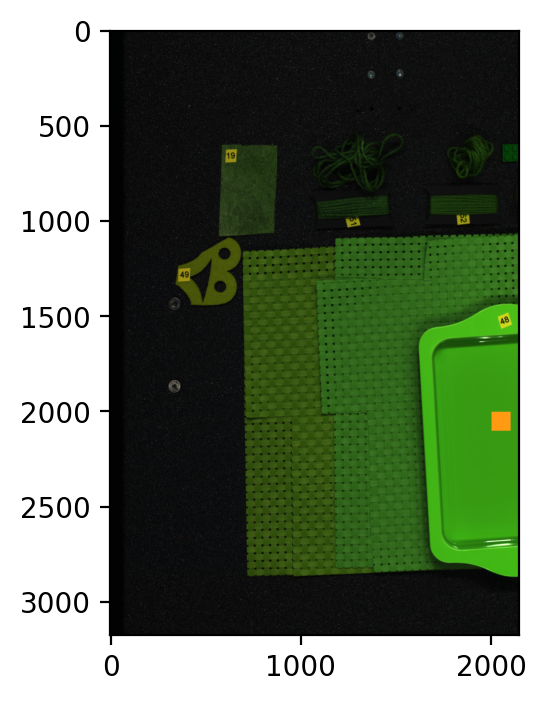

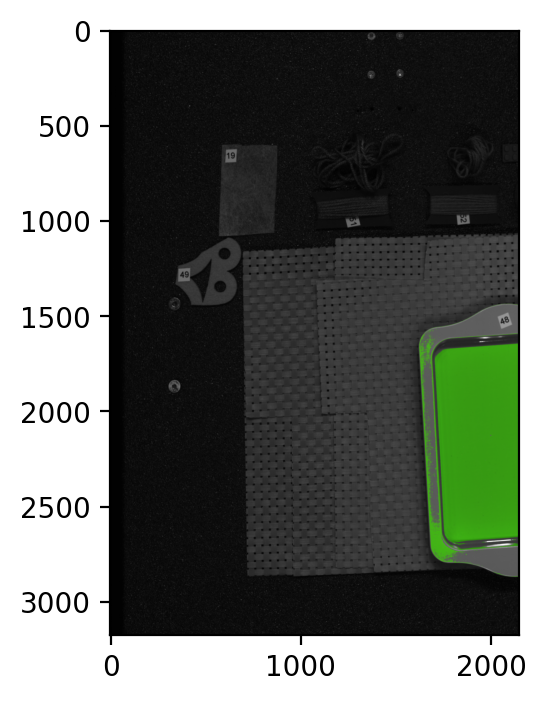

In [ ]:
# Generate Band based condition
n = 5 # the number of important bnds
bbands = numpy.empty(n, dtype=numpy.uint16) # array size of number of important bands
# we select the importqant bands:
bbands[0] = 20
bbands[1] = 40
bbands[2] = 70
bbands[3] = 100
bbands[4] = 120

# Read selected spectrum, ploted and saved in prevous code section 
open_path = "/content/drive/MyDrive/mushrom_image0001.raw"
fopen = open(open_path, "rb")
selected = numpy.fromfile(fopen, dtype=numpy.float32) 
fopen.close()
###################################################################################################
# ratio is an array of ratios: ratio[n]=selcted[bbands[n+1]]/selected[bbands[n]]
ratio = numpy.zeros(n-1) # array of ratios: ratio[n]=selcted[bbands[n+1]]/selected[bbands[n]]
for i in range(n-1):
  ratio[i] = selected[bbands[i]]
###################################################################################################
# now we make a new 'small_spectral_cube' made of selected bands from 'spectral_cube'
[s1, s2, s3] = spectral_cube.shape
print(s1, s2, s3)
small_spectral_cube = numpy.empty((lines, samples, n), dtype=numpy.float32)
i=0
for band in bbands:
  small_spectral_cube[:,:,i] = spectral_cube[:,band,:]
  print(band)
  i=i+1
print('RGB: ', RGB.shape)
print('cube: ', spectral_cube.shape)
print('small cube: ', small_spectral_cube.shape)

###################################################################################################
mask = RGB.copy()

for i in range(0,s1):  #s1
  for j in range(0,s3): #s3
    criteria = 0
    for ch in range(n-1):
      #mask[i,j,0]=1
      if numpy.abs((small_spectral_cube[i,j,ch]-ratio[ch]))>0.1: #[0.02 - 0.18] threshold
        criteria = 1
        # ´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´
        gray_color = (mask[i,j,0] + mask[i,j,1] + mask[i,j,2])/3 # make mask gray scale and only selection RGB
        mask[i,j,0]=gray_color
        mask[i,j,1]=gray_color
        mask[i,j,2]=gray_color                       
        # ´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´
    if criteria == 0:
      pass

print(numpy.amax(small_spectral_cube))
print(numpy.amax(mask))
print(numpy.amax(RGB))
###################################################################################################
plt.rcParams['figure.dpi'] = 200
plt.imshow(RGB2)

plt.show()
plt.rcParams['figure.dpi'] = 200

plt.show()

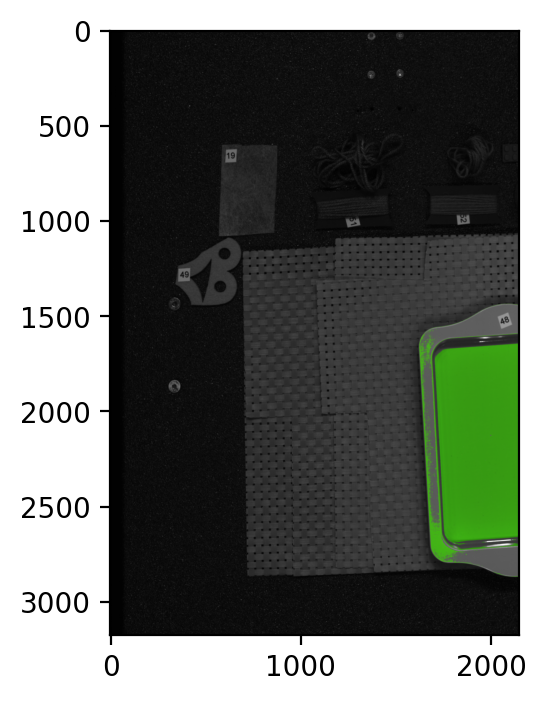

In [ ]:
plt.imshow(mask)


Now for the freen samples of the specim IQ 

Again first we need to do the white correction

In [ ]:
# Read wavelengths from hdr file
hdr_path = "/content/drive/MyDrive/Group3 session 2/[Specim IQ]/Green samples/capture/406.hdr"
f=open(hdr_path, "r")
filelines = f.readlines()
#print(filelines)
f.close()
waves = numpy.zeros(135,)
n = 0
for i in range(55, 55+135):
  #print(filelines[i])
  waves[n] = float(filelines[i].replace(',',''))
  #print(waves[n])
  n = n + 1


In [ ]:
# Read image
open_path = "/content/drive/MyDrive/Group3 session 2/[Specim IQ]/Green samples/capture/406.raw"
samples = 512
bands = 204
lines = 512

# Read raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) 
spectral_image = numpy.reshape(raw_image, (lines, bands, samples))

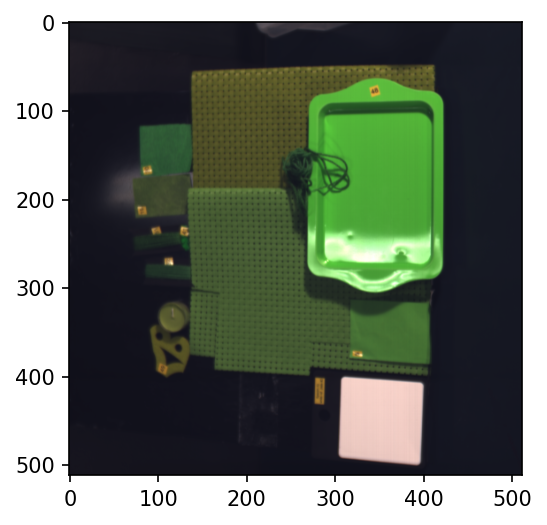

In [ ]:
# Plot RGB preview
plt.rcParams['figure.dpi'] = 100
RGB = numpy.empty((lines,samples, 3), dtype = numpy.float32)
ch1 = 72 # Red
ch2 = 43  # Green
ch3 = 25  # Blue
RGB[:,:,0] = spectral_image[:,ch1,:]/ numpy.amax(spectral_image[:,ch1,:])
RGB[:,:,1] = spectral_image[:,ch2,:]/ numpy.amax(spectral_image[:,ch2,:])
RGB[:,:,2] = spectral_image[:,ch3,:]/ numpy.amax(spectral_image[:,ch3,:])
plt.rcParams['figure.dpi'] = 150
plt.imshow(RGB)
plt.show()

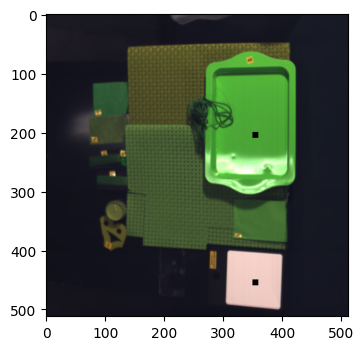

In [ ]:
# Select Green
y1 = 200
y2 = 210
x1 = 350
x2 = 360
RGB[y1:y2,x1:x2,0] = 0
RGB[y1:y2,x1:x2,1] = 0
RGB[y1:y2,x1:x2,2] = 0
sel = spectral_image[y1:y2,:,x1:x2]
sel1 = numpy.sum(sel, axis = 0)
green = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))

# Select White
y1 = 450
y2 = 460
x1 = 350
x2 = 360
RGB[y1:y2,x1:x2,0] = 0
RGB[y1:y2,x1:x2,1] = 0
RGB[y1:y2,x1:x2,2] = 0
sel = spectral_image[y1:y2,:,x1:x2]
sel1 = numpy.sum(sel, axis = 0)
white = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
##################################################################
plt.rcParams['figure.dpi'] = 100
plt.imshow(RGB)
plt.show()

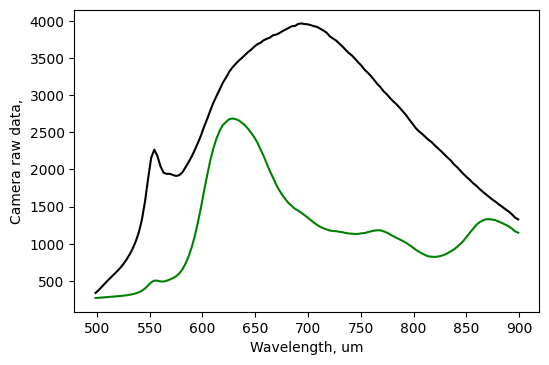

In [ ]:
plt.plot(waves, green[:135], "g")
plt.plot(waves, white[:135], "black")

plt.rcParams['figure.dpi'] = 100
plt.xlabel('Wavelength, um')
plt.ylabel('Camera raw data,')
#plt.ylabel('Reflectance [0-100]%')
plt.show()

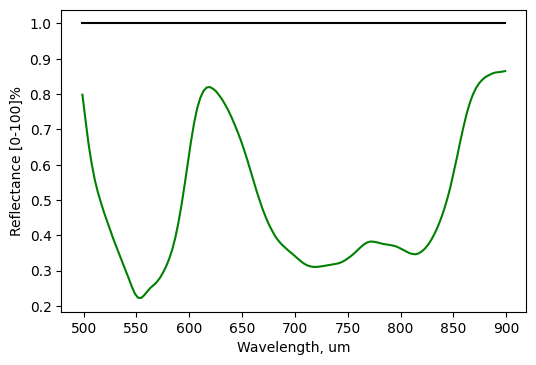

In [ ]:
# spectral_cube[i,:,:] = numpy.divide(upper_part[i,:,:], lower_part)
green_cor = green/white
white_cor = white/white
plt.rcParams['figure.dpi'] = 100

plt.plot(waves, green_cor[:135], "g")
plt.plot(waves, white_cor[:135], "black")
plt.xlabel('Wavelength, um')
plt.ylabel('Camera raw data,')
plt.ylabel('Reflectance [0-100]%')
plt.show()

In [ ]:
# Correct all image
spectral_cube = numpy.empty((lines,bands,samples), dtype = numpy.float32)
for i in range(0,lines):
  for j in range(0,samples):
    spectral_cube[i,:,j] = spectral_image[i,:,j]/white #numpy.divide(spectral_image[i,:,j], white)

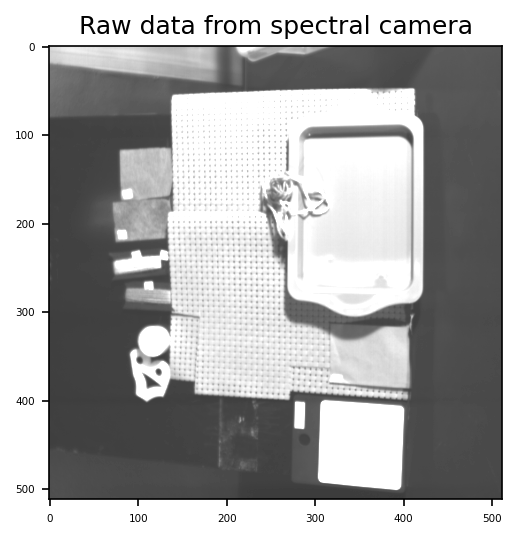

In [ ]:
# Plot results before and after white correction
plt.rcParams['figure.dpi'] = 150
plt.imshow(spectral_image[:,100,:], cmap="gray", vmin=0, vmax=1050)#
plt.title("Raw data from spectral camera")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()


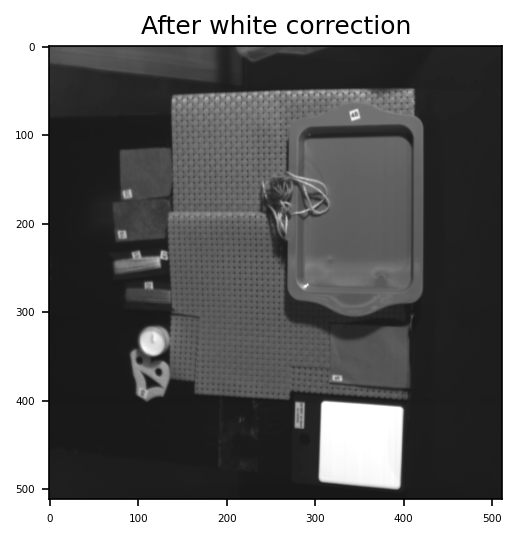

In [ ]:
plt.rcParams['figure.dpi'] = 150
plt.imshow(spectral_cube[:,100,:], cmap="gray", vmin=0, vmax= 1)#
plt.title("After white correction")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()


711.56
625.22
572.07


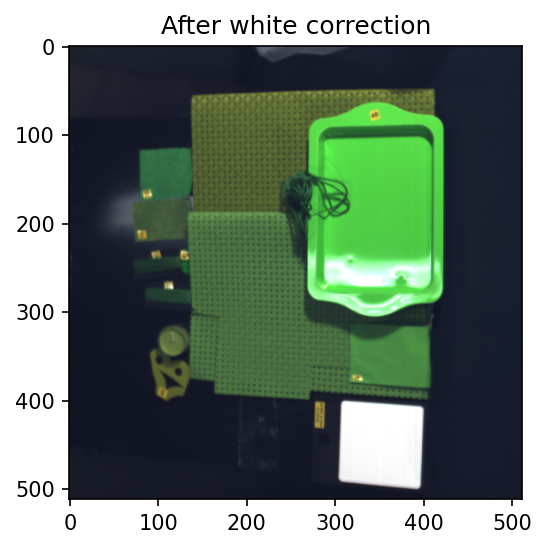

In [ ]:
# Show RGB image
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
RGB = numpy.empty((lines, samples, 3), dtype=numpy.float32)
ch_1 = 72
ch_2 = 43
ch_3 = 25
print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])
#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = spectral_cube[:,ch_1,:]
RGB[:,:,1] = spectral_cube[:,ch_2,:]
RGB[:,:,2] = spectral_cube[:,ch_3,:]
plt.rcParams['figure.dpi'] = 150
plt.imshow(RGB)
plt.title("After white correction")
plt.show()

[0.07988759 0.09334727 0.14797047]


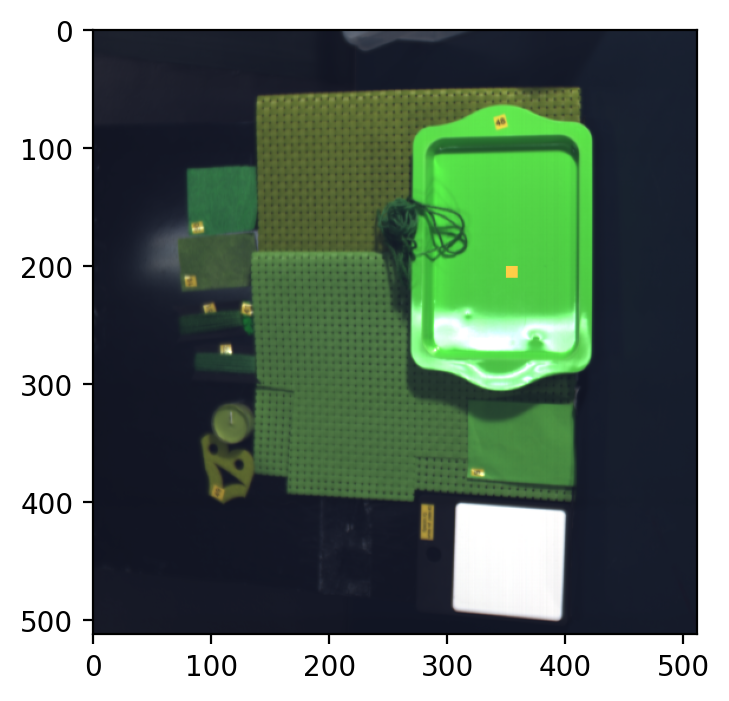

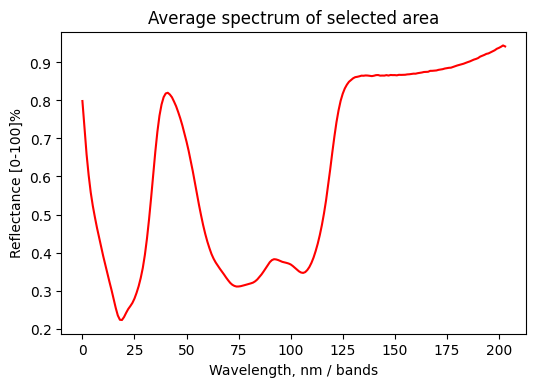

In [ ]:
# Selct area and plot its avearage spectrum
print(RGB[100,100,:])
RGB3 = RGB.copy()
##################################################################

# Sample 19
x1 = 200
x2 = 210
y1 = 350
y2 = 360

plt.rcParams['figure.dpi'] = 200

RGB3[x1:x2,y1:y2,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
#print(spectral_cube.shape)
#print(plastic.shape)

sel1 = numpy.sum(sel, axis = 0)
#print(pl1.shape)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
#print(pl2.shape)

##################################################################

plt.imshow(RGB3)
plt.rcParams['figure.dpi'] = 100
plt.show()


plt.plot(selection1, 'r') #plt.plot(waves,selection1)
plt.xlabel('Wavelength, nm / bands')
plt.ylabel('Reflectance [0-100]%')
plt.title("Average spectrum of selected area")


plt.show()

# save 
saveraw = "/content/drive/MyDrive/green_image0001.raw"
fileobj = open(saveraw, mode='wb')
selection1.tofile(fileobj)
fileobj.close()




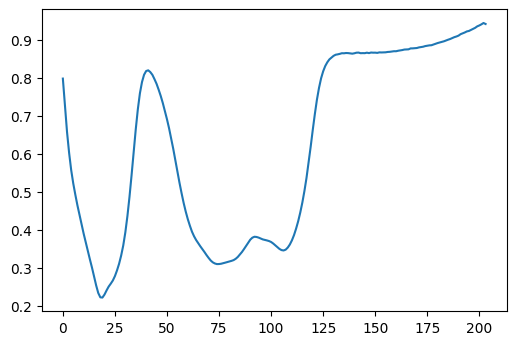

In [ ]:
open_path = "/content/drive/MyDrive/green_image0001.raw"
fopen = open(open_path, "rb")
mushroom = numpy.fromfile(fopen, dtype=numpy.float32) 
fopen.close()
plt.plot(mushroom)
plt.show()

512 204 512
20
40
70
150
RGB:  (512, 512, 3)
cube:  (512, 204, 512)
small cube:  (512, 512, 4)


1.8770627
1.1928844
1.2896794


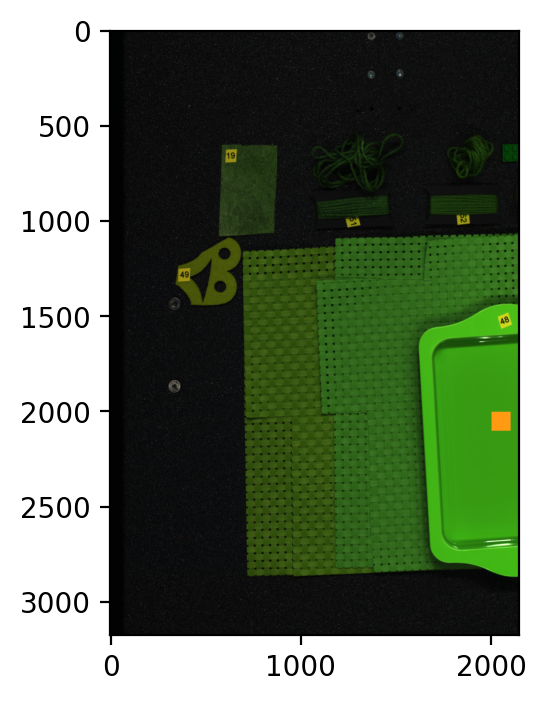

In [ ]:
# Generate Band based condition
n = 4 # the number of important bnds
bbands = numpy.empty(n, dtype=numpy.uint16) # array size of number of important bands
# we select the importqant bands:
bbands[0] = 20
bbands[1] = 40
bbands[2] = 70
bbands[3] = 150

# Read selected spectrum, ploted and saved in prevous code section 
open_path = "/content/drive/MyDrive/green_image0001.raw"
fopen = open(open_path, "rb")
selected = numpy.fromfile(fopen, dtype=numpy.float32) 
fopen.close()
###################################################################################################
# ratio is an array of ratios: ratio[n]=selcted[bbands[n+1]]/selected[bbands[n]]
ratio = numpy.zeros(n-1) # array of ratios: ratio[n]=selcted[bbands[n+1]]/selected[bbands[n]]
for i in range(n-1):
  ratio[i] = selected[bbands[i]]
###################################################################################################
# now we make a new 'small_spectral_cube' made of selected bands from 'spectral_cube'
[s1, s2, s3] = spectral_cube.shape
print(s1, s2, s3)
small_spectral_cube = numpy.empty((lines, samples, n), dtype=numpy.float32)
i=0
for band in bbands:
  small_spectral_cube[:,:,i] = spectral_cube[:,band,:]
  print(band)
  i=i+1
print('RGB: ', RGB.shape)
print('cube: ', spectral_cube.shape)
print('small cube: ', small_spectral_cube.shape)

###################################################################################################
mask = RGB.copy()

for i in range(0,s1):  #s1
  for j in range(0,s3): #s3
    criteria = 0
    for ch in range(n-1):
      #mask[i,j,0]=1
      if numpy.abs((small_spectral_cube[i,j,ch]-ratio[ch]))>0.1: #[0.02 - 0.18] threshold
        criteria = 1
        # ´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´
        gray_color = (mask[i,j,0] + mask[i,j,1] + mask[i,j,2])/3 # make mask gray scale and only selection RGB
        mask[i,j,0]=gray_color
        mask[i,j,1]=gray_color
        mask[i,j,2]=gray_color                       
        # ´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´
    if criteria == 0:
      pass

print(numpy.amax(small_spectral_cube))
print(numpy.amax(mask))
print(numpy.amax(RGB))
###################################################################################################
plt.rcParams['figure.dpi'] = 200
plt.imshow(RGB2)

plt.show()
plt.rcParams['figure.dpi'] = 200

plt.show()

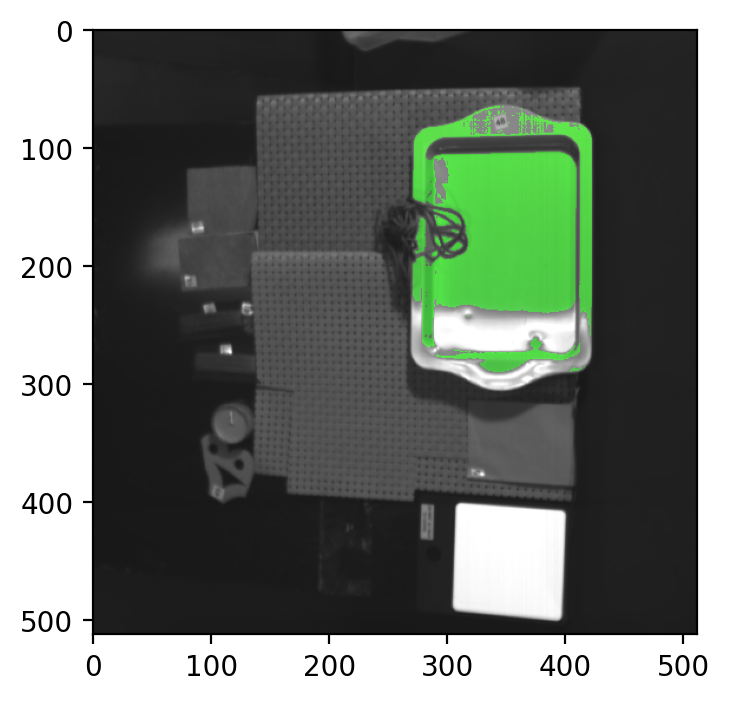

In [ ]:
plt.imshow(mask)


And last for the tunable files: 

720 1280 130
(720, 130, 1280)
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable/GreenItems, ch 1, exp 1000 ms.png
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable/GreenItems, ch 1, exp 500 ms.png
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable/GreenItems, ch 1, exp 250 ms.png
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable/GreenItems, ch 1, exp 15.6 ms.png
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable/GreenItems, ch 1, exp 62.5 ms.png
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable/GreenItems, ch 1, exp 125 ms.png
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable/GreenItems, ch 1, exp 31.3 ms.png
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable/GreenItems, ch 1, exp 7.8 ms.png
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable/GreenItems, ch 1, exp 0.9766 ms.png
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable/GreenItems, ch 1, exp 2 ms.png
/content/drive/MyDrive/Group3 session 2/[tunable]/Tunab

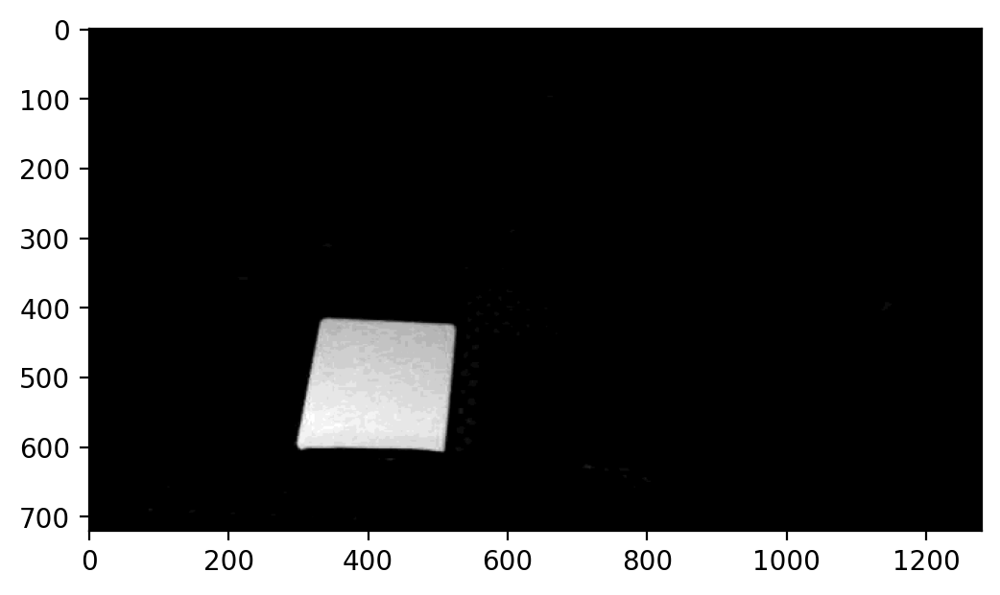

In [ ]:
from PIL import Image
import os
# Read Dir with Nuance spectral image slices
# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
# This will be arbitrary order of spectral slices [Color checker_400.tif, Color checker_720.tif]. Thus it can be 500, 720, 420... etc, i.e. wrong order
# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
dirpath = "/content/drive/MyDrive/Group3 session 2/[tunable]/Tunable"
myDir = os.listdir(dirpath)
# Read the first image define it size, define the total number of Images and get the size of future ENVI Spectral Cube
fullpath = os.path.join(dirpath, myDir[0])
im = Image.open(fullpath) 
single_slice = numpy.array(im) # make a numpy array
[x, y] = single_slice.shape 
spectral = len(myDir)
print(x, y, spectral)

# save as integers, data type = 12
spectral_cube = numpy.ndarray(shape=(x,spectral,y), dtype=numpy.uint16)
print(spectral_cube.shape)

i=0
for file in myDir:
  fullpath = os.path.join(dirpath, file)
  print(fullpath)
  im = Image.open(fullpath) 
  single_slice = numpy.array(im)
  #print(imarray.shape)
  spectral_cube[:,i,:]=single_slice
  i = i + 1

# Save ready ENVI cube made of tiffs
saveraw = "/content/drive/MyDrive/savedata/tunable.raw"
fileobj = open(saveraw, mode='wb')
spectral_cube.tofile(fileobj)
fileobj.close()
print('Ready')
plt.imshow(spectral_cube[:,10,:], cmap='gray') #, vmin=0, vmax=3138
im.show()

In [ ]:
# Read image
open_path = "/content/drive/MyDrive/savedata/tunable.raw"
samples = 1280
bands = 130
lines = 720

# Read raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) 
spectral_image = numpy.reshape(raw_image, (lines, bands, samples))

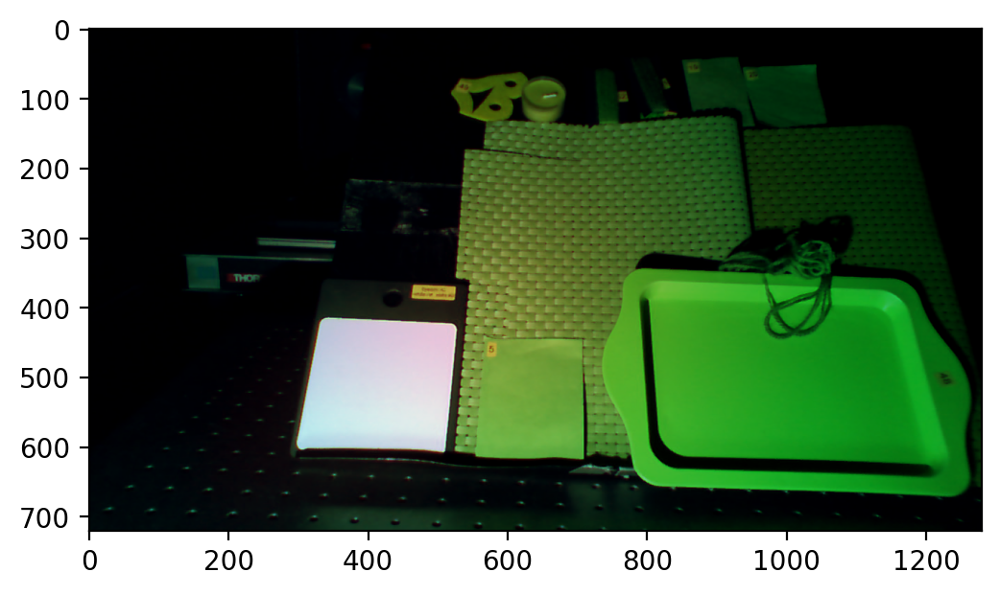

In [ ]:
# Plot RGB preview
plt.rcParams['figure.dpi'] = 100
RGB = numpy.empty((lines,samples, 3), dtype = numpy.float32)
ch1 = 120 # Red
ch2 = 60  # Green
ch3 = 15  # Blue
RGB[:,:,0] = spectral_image[:,ch1,:]/ numpy.amax(spectral_image[:,ch1,:])
RGB[:,:,1] = spectral_image[:,ch2,:]/ numpy.amax(spectral_image[:,ch2,:])
RGB[:,:,2] = spectral_image[:,ch3,:]/ numpy.amax(spectral_image[:,ch3,:])
plt.rcParams['figure.dpi'] = 200
plt.imshow(RGB)
plt.show()

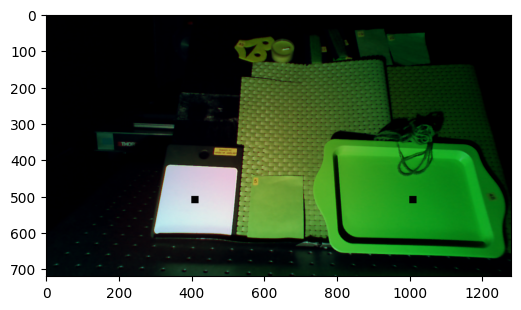

In [ ]:
# Select Green
x1 = 1000
x2 = 1020
y1 = 500
y2 = 520
RGB[y1:y2,x1:x2,0] = 0
RGB[y1:y2,x1:x2,1] = 0
RGB[y1:y2,x1:x2,2] = 0
sel = spectral_image[y1:y2,:,x1:x2]
sel1 = numpy.sum(sel, axis = 0)
green = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))

# Select White
x1 = 400
x2 = 420
y1 = 500
y2 = 520
RGB[y1:y2,x1:x2,0] = 0
RGB[y1:y2,x1:x2,1] = 0
RGB[y1:y2,x1:x2,2] = 0
sel = spectral_image[y1:y2,:,x1:x2]
sel1 = numpy.sum(sel, axis = 0)
white = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
##################################################################
plt.rcParams['figure.dpi'] = 100
plt.imshow(RGB)
plt.show()

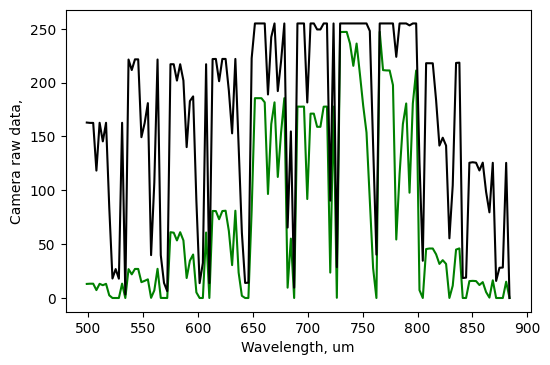

In [ ]:
plt.plot(waves[:130], green[:135], "g")
plt.plot(waves[:130], white[:135], "black")

plt.rcParams['figure.dpi'] = 100
plt.xlabel('Wavelength, um')
plt.ylabel('Camera raw data,')
#plt.ylabel('Reflectance [0-100]%')
plt.show()

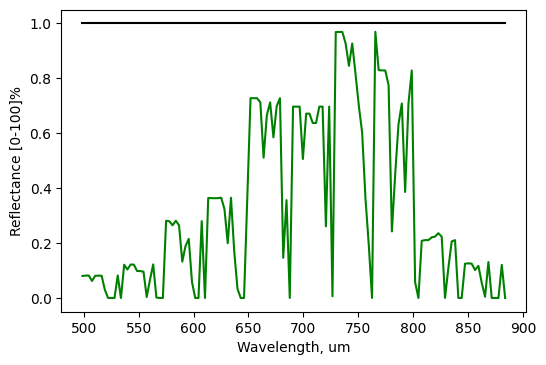

In [ ]:
# spectral_cube[i,:,:] = numpy.divide(upper_part[i,:,:], lower_part)
green_cor = green/white
white_cor = white/white
plt.rcParams['figure.dpi'] = 100

plt.plot(waves[:130], green_cor[:135], "g")
plt.plot(waves[:130], white_cor[:135], "black")
plt.xlabel('Wavelength, um')
plt.ylabel('Camera raw data,')
plt.ylabel('Reflectance [0-100]%')
plt.show()

In [ ]:
# Correct all image
spectral_cube = numpy.empty((lines,bands,samples), dtype = numpy.float32)
for i in range(0,lines):
  for j in range(0,samples):
    spectral_cube[i,:,j] = spectral_image[i,:,j]/white #numpy.divide(spectral_image[i,:,j], white)

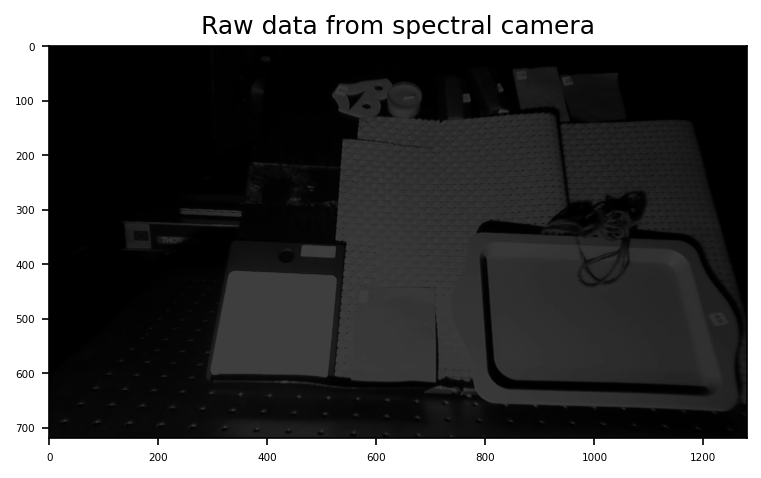

In [ ]:
# Plot results before and after white correction
plt.rcParams['figure.dpi'] = 150
plt.imshow(spectral_image[:,100,:], cmap="gray", vmin=0, vmax=1050)#
plt.title("Raw data from spectral camera")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()


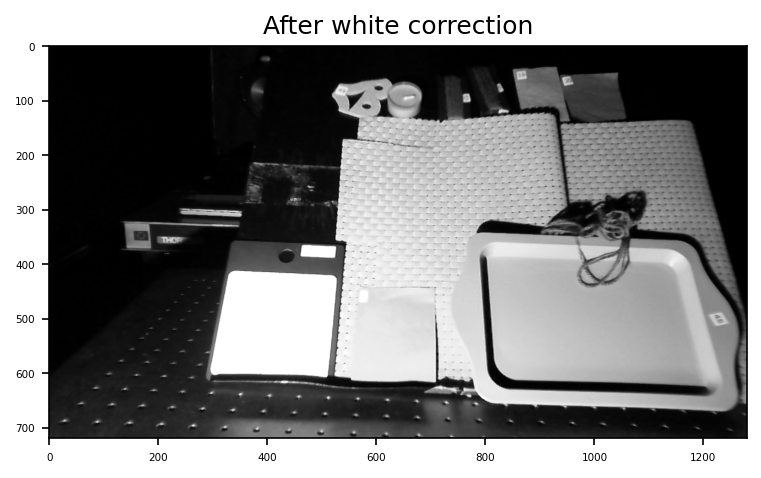

In [ ]:
plt.rcParams['figure.dpi'] = 150
plt.imshow(spectral_cube[:,100,:], cmap="gray", vmin=0, vmax= 1)#
plt.title("After white correction")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()


856.37
675.73
542.68


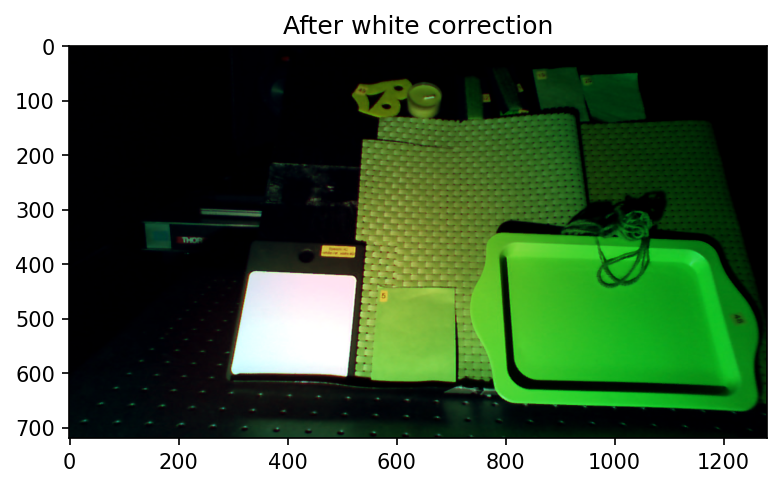

In [ ]:
# Show RGB image
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
RGB = numpy.empty((lines, samples, 3), dtype=numpy.float32)
ch_1 = 120
ch_2 = 60
ch_3 = 15
print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])
#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = spectral_cube[:,ch_1,:]
RGB[:,:,1] = spectral_cube[:,ch_2,:]
RGB[:,:,2] = spectral_cube[:,ch_3,:]
plt.rcParams['figure.dpi'] = 150
plt.imshow(RGB)
plt.title("After white correction")
plt.show()

[0.         0.         0.00451152]


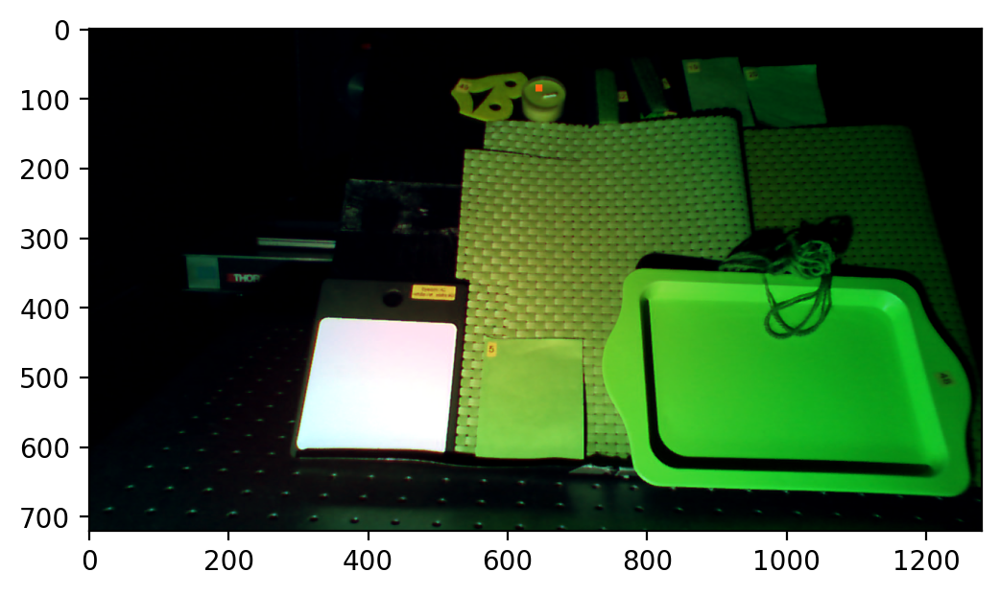

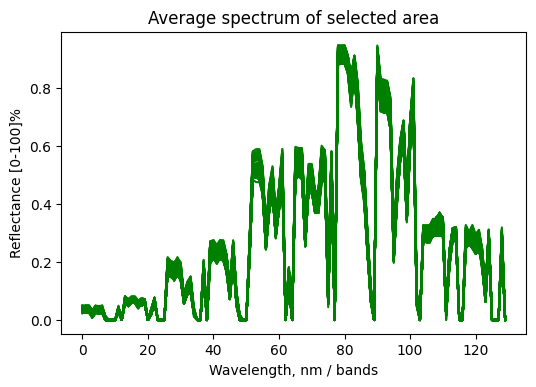

In [85]:
# Selct area and plot its avearage spectrum
print(RGB[100,100,:])
RGB4 = RGB.copy()
##################################################################

# Sample 
y1 = 640
y2 = 650
x1 = 80
x2 = 90

plt.rcParams['figure.dpi'] = 200

RGB4[x1:x2,y1:y2,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
#print(spectral_cube.shape)
#print(plastic.shape)

sel1 = numpy.sum(sel, axis = 0)
#print(pl1.shape)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
#print(pl2.shape)

##################################################################

plt.imshow(RGB4)
plt.rcParams['figure.dpi'] = 100
plt.show()


plt.plot(selection1, 'r') #plt.plot(waves,selection1)
plt.xlabel('Wavelength, nm / bands')
plt.ylabel('Reflectance [0-100]%')
plt.title("Average spectrum of selected area")

for i in range(10):
  plt.plot(sel[i,:,], 'g') #plt.plot(waves,selection1)



plt.show()

# save 
saveraw = "/content/drive/MyDrive/green_image0002.raw"
fileobj = open(saveraw, mode='wb')
selection1.tofile(fileobj)
fileobj.close()






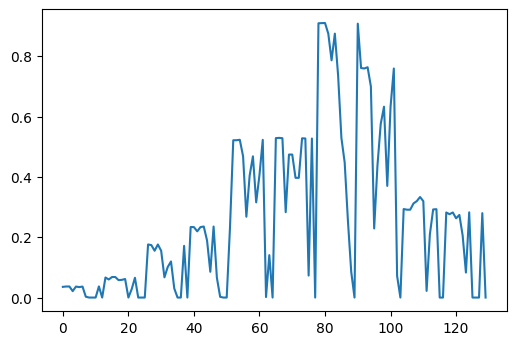

In [86]:
open_path = "/content/drive/MyDrive/green_image0002.raw"
fopen = open(open_path, "rb")
mushroom = numpy.fromfile(fopen, dtype=numpy.float32) 
fopen.close()
plt.plot(mushroom)
plt.show()

720 130 1280
20
40
80
110
RGB:  (720, 1280, 3)
cube:  (720, 130, 1280)
small cube:  (720, 1280, 4)


1.2307693
1.118676
1.1735157


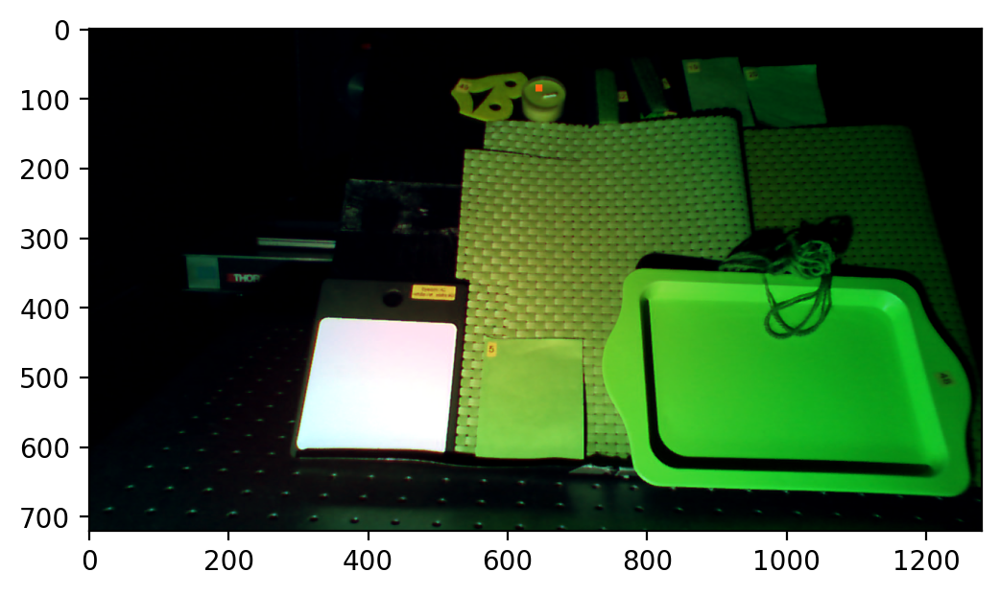

In [87]:
# Generate Band based condition
n = 4 # the number of important bnds
bbands = numpy.empty(n, dtype=numpy.uint16) # array size of number of important bands
# we select the importqant bands:
bbands[0] = 20
bbands[1] = 40
bbands[2] = 80
bbands[3] = 110

# Read selected spectrum, ploted and saved in prevous code section 
open_path = "/content/drive/MyDrive/green_image0002.raw"
fopen = open(open_path, "rb")
selected = numpy.fromfile(fopen, dtype=numpy.float32) 
fopen.close()
###################################################################################################
# ratio is an array of ratios: ratio[n]=selcted[bbands[n+1]]/selected[bbands[n]]
ratio = numpy.zeros(n-1) # array of ratios: ratio[n]=selcted[bbands[n+1]]/selected[bbands[n]]
for i in range(n-1):
  ratio[i] = selected[bbands[i]]
###################################################################################################
# now we make a new 'small_spectral_cube' made of selected bands from 'spectral_cube'
[s1, s2, s3] = spectral_cube.shape
print(s1, s2, s3)
small_spectral_cube = numpy.empty((lines, samples, n), dtype=numpy.float32)
i=0
for band in bbands:
  small_spectral_cube[:,:,i] = spectral_cube[:,band,:]
  print(band)
  i=i+1
print('RGB: ', RGB.shape)
print('cube: ', spectral_cube.shape)
print('small cube: ', small_spectral_cube.shape)

###################################################################################################
mask = RGB.copy()

for i in range(0,s1):  #s1
  for j in range(0,s3): #s3
    criteria = 0
    for ch in range(n-1):
      #mask[i,j,0]=1
      if numpy.abs((small_spectral_cube[i,j,ch]-ratio[ch]))>0.05: #[0.02 - 0.18] threshold
        criteria = 1
        # ´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´
        gray_color = (mask[i,j,0] + mask[i,j,1] + mask[i,j,2])/3 # make mask gray scale and only selection RGB
        mask[i,j,0]=gray_color
        mask[i,j,1]=gray_color
        mask[i,j,2]=gray_color                       
        # ´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´
    if criteria == 0:
      pass

print(numpy.amax(small_spectral_cube))
print(numpy.amax(mask))
print(numpy.amax(RGB))
###################################################################################################
plt.rcParams['figure.dpi'] = 200
plt.imshow(RGB4)

plt.show()
plt.rcParams['figure.dpi'] = 200

plt.show()


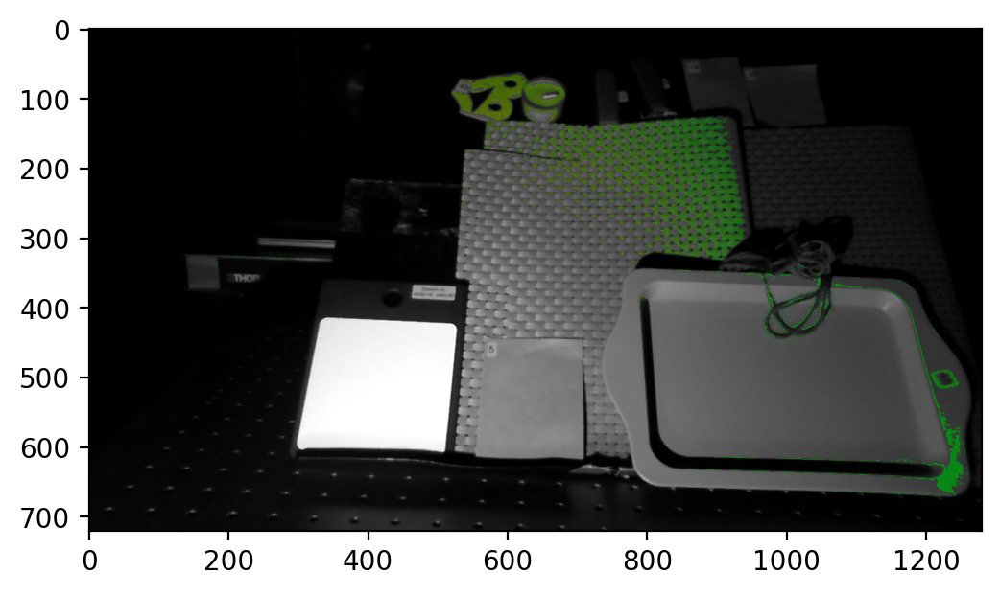

In [88]:
plt.imshow(mask)


This time the segmentation was not as good as before. As the band selection was much more difficult this could have been a reason. Another reason could be that other materials spectra are similar to the candle or the treshold was not set ideally.

**Tasks #2. White powders**

Take spectral image of white powders, plot all spectra, select optimal bands to generated as many color in RGB-preview as psossible. Return RGB-preview image for Visible

In [3]:
# Read hdr
path = "/content/drive/MyDrive/Group3 session 2/[scanner]/vis_white_powders/capture"

[object_raw, object_hdr, white_raw, white_hdr, dark_raw, dark_hdr ] = readDir(path)
print(object_raw)
samples = 512 
[samples, bands, lines, waves] = read_hdr(object_hdr)

open_path = object_raw
# Read raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
spectral_image = numpy.reshape(raw_image, (lines, bands, samples))
print('spectral_image.shape: ', spectral_image.shape)

/content/drive/MyDrive/Group3 session 2/[scanner]/vis_white_powders/capture/vis_scan_0066.raw
2144
2144 2033 135
54
55
190
spectral_image.shape:  (2033, 135, 2144)


/content/drive/MyDrive/Group3 session 2/[scanner]/vis_white_powders/capture/WHITEREF_vis_scan_0066.hdr
2144
2144 151 135
54
55
190
2144 135 151


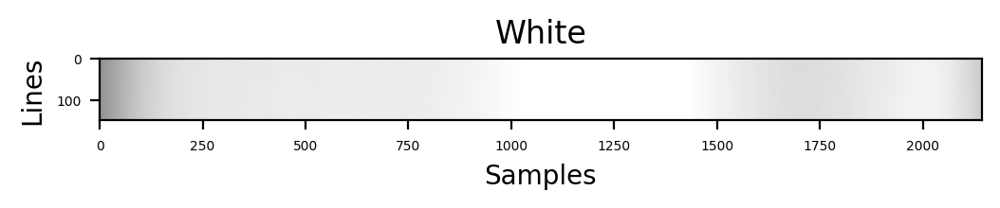

2144
2144 100 135
54
55
190


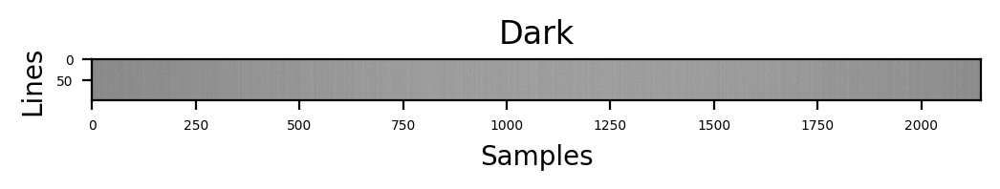

In [4]:
# Read White
print(white_hdr)
[samples, bands, lines, waves] = read_hdr(white_hdr)
print(samples, bands, lines)
open_path = white_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
white_image = numpy.reshape(raw_image, (lines, bands, samples))/lines
plt.rcParams['figure.dpi'] = 200
plt.imshow(white_image[:,100,:], cmap="gray", vmin=0, vmax=250)#
plt.title("White")
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()
###############################################
# Read Dark
[samples, bands, lines, waves] = read_hdr(dark_hdr)
open_path = dark_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
dark_image = numpy.reshape(raw_image, (lines, bands, samples))/lines

plt.rcParams['figure.dpi'] = 200
plt.imshow(dark_image[:,100,:], cmap="gray", vmin=0, vmax=2)#
plt.title("Dark")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.show()


In [5]:
# Calculate average for Dark and White

# Spectral_cube = upper_part/lower_part
# upper_part = spectral_image-dark
# lower_part = white - dark

white_av = numpy.sum(white_image, axis = 0) # get average for White
#print(white_image.shape)
#print(white_av.shape)
dark_av = numpy.sum(dark_image, axis = 0) # get average for White
#print(dark_image.shape)
#print(dark_av.shape)

[lines, bansd, samples] = spectral_image.shape
print(spectral_image.shape)
upper_part = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
spectral_cube = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
# Subtract [image - dark]
for i in range(lines):
  upper_part[i,:,:] = numpy.subtract(spectral_image[i,:,:], dark_av) 
# Subtract [white - dark]
lower_part = numpy.subtract(white_av, dark_av) 
# Subtract [image - dark]
for i in range(lines):
  spectral_cube[i,:,:] = numpy.divide(upper_part[i,:,:], lower_part)
# spectral_cube[:,:,:]  a white corrected spectral cube
# Calculate average for Dark and White

# Spectral_cube = upper_part/lower_part
# upper_part = spectral_image-dark
# lower_part = white - dark

white_av = numpy.sum(white_image, axis = 0) # get average for White
#print(white_image.shape)
#print(white_av.shape)
dark_av = numpy.sum(dark_image, axis = 0) # get average for White
#print(dark_image.shape)
#print(dark_av.shape)

[lines, bansd, samples] = spectral_image.shape
print(spectral_image.shape)
upper_part = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
spectral_cube = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
# Subtract [image - dark]
for i in range(lines):
  upper_part[i,:,:] = numpy.subtract(spectral_image[i,:,:], dark_av) 
# Subtract [white - dark]
lower_part = numpy.subtract(white_av, dark_av) 
# Subtract [image - dark]
for i in range(lines):
  spectral_cube[i,:,:] = numpy.divide(upper_part[i,:,:], lower_part)
# spectral_cube[:,:,:]  a white corrected spectral cube


(2033, 135, 2144)
(2033, 135, 2144)


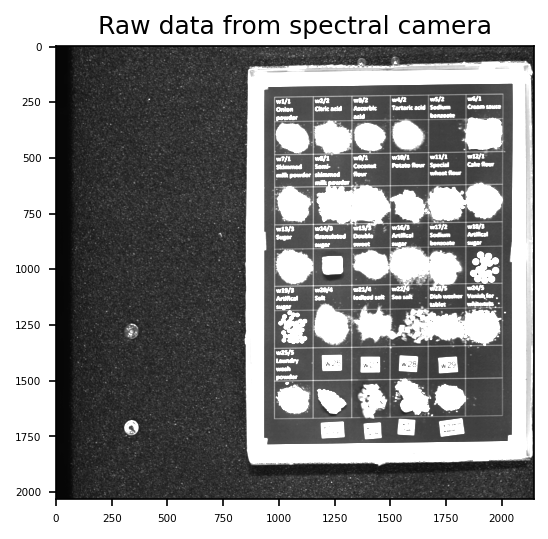

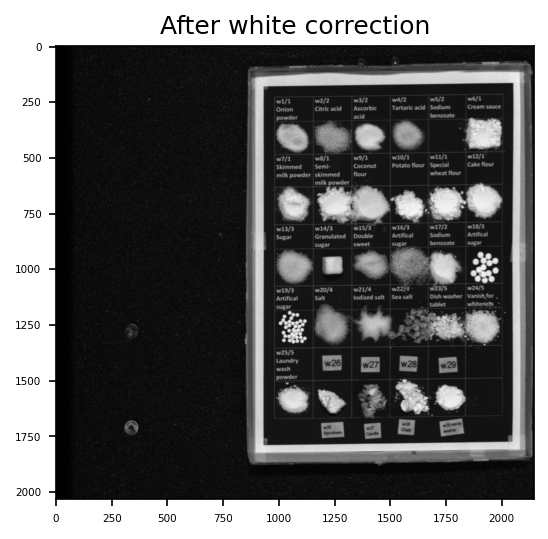

In [6]:
# Plot results before and after white correction
plt.rcParams['figure.dpi'] = 150
plt.imshow(spectral_image[:,100,:], cmap="gray", vmin=0, vmax=10050)#
plt.title("Raw data from spectral camera")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()
plt.imshow(spectral_cube[:,100,:], cmap="gray", vmin=0, vmax= 1)#
plt.title("After white correction")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()




696.59
569.76
470.16


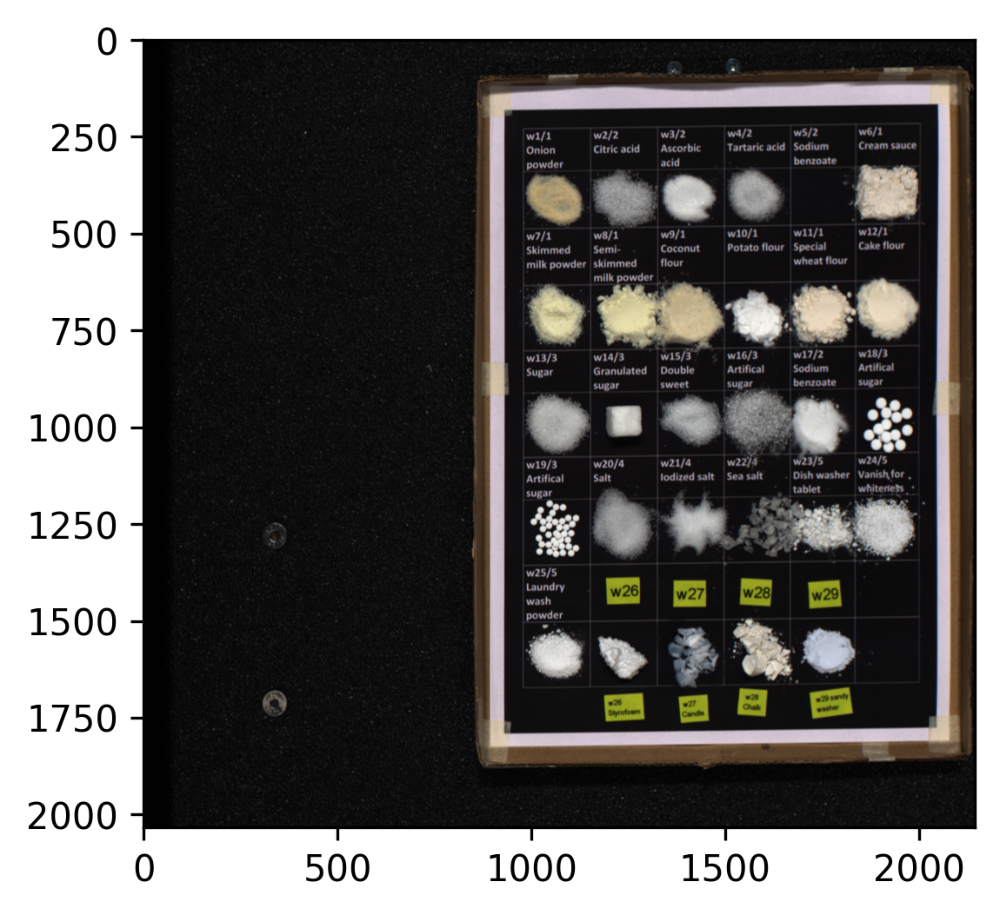

In [7]:
# Show RGB image
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
RGB = numpy.empty((lines, samples, 3), dtype=numpy.float32)
ch_1 = 75
ch_2 = 50
ch_3 = 30
print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])
#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = spectral_cube[:,ch_1,:]
RGB[:,:,1] = spectral_cube[:,ch_2,:]
RGB[:,:,2] = spectral_cube[:,ch_3,:]
plt.rcParams['figure.dpi'] = 300
plt.imshow(RGB)

plt.show()

[0.02923005 0.02853354 0.03598264]


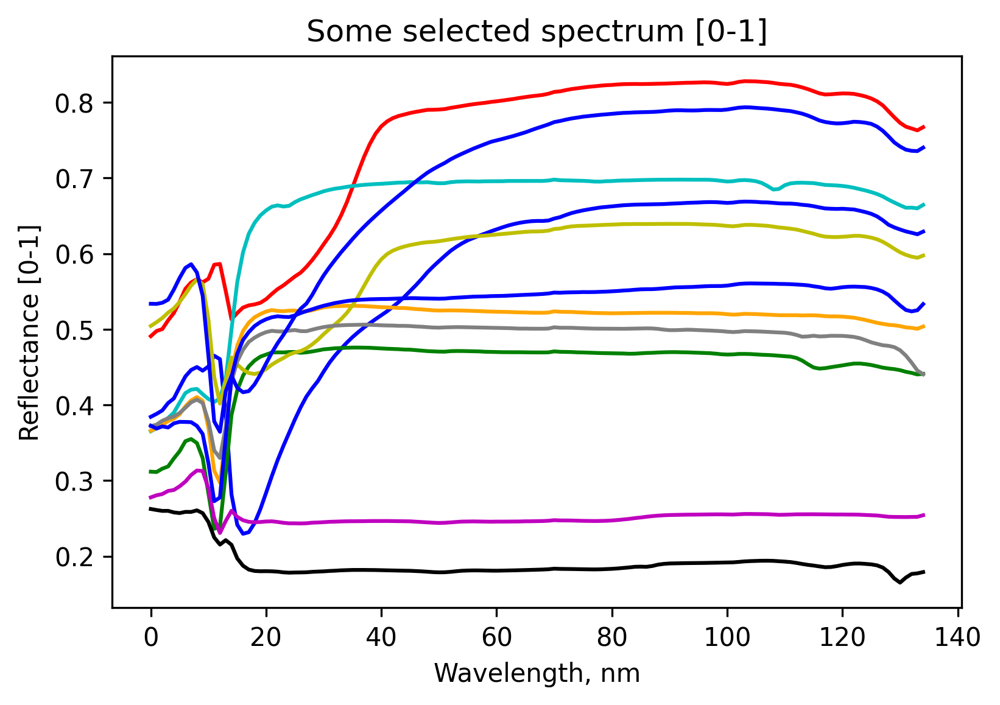

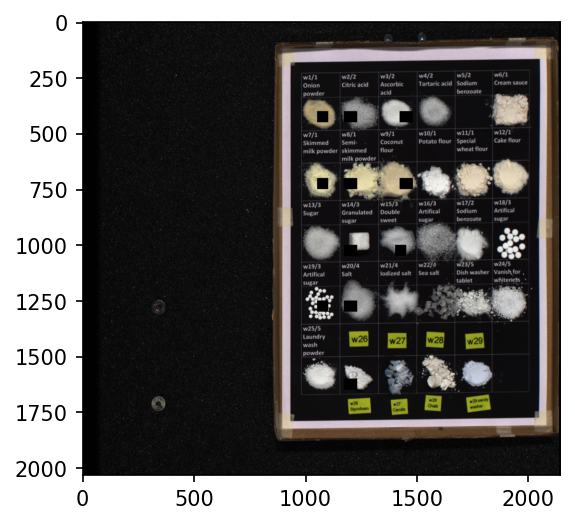

'\n# save \nsaveraw = "/content/drive/My Drive/Colab Notebooks/Temp/green.raw"\nfileobj = open(saveraw, mode=\'wb\')\nselection1.tofile(fileobj)\nfileobj.close()\n'

In [8]:
# Selct area and plot its avearage spectrum
print(RGB[100,100,:])
RGB2 = RGB.copy()
##################################################################
# Select 1, Onion Powder
y1 = 1050
y2 = 1100
x1 = 400
x2 = 450 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'b') 

##################################################################
# Select 2,Sugar
y1 = 1050
y2 = 1100
x1 = 700
x2 = 750 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'r') 

##################################################################
# Select 3, Artificial Sugar
y1 = 1400
y2 = 1450
x1 = 1000
x2 = 1050 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'g')

##################################################################
# Select 4, Laundry wash powder
y1 = 1050
y2 = 1100
x1 = 1250
x2 = 1300 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'c')

##################################################################
# Select 5, Candle
y1 = 1170
y2 = 1230
x1 = 1600
x2 = 1650 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'m') 

##################################################################
# Select 6, w26
y1 = 1170
y2 = 1230
x1 = 1250
x2 = 1300 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'orange') 

##################################################################
# Select 7, Salt
y1 = 1170
y2 = 1230
x1 = 1000
x2 = 1050 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'black') 

##################################################################
# Select 8, Gran. Sugar
y1 = 1170
y2 = 1230
x1 = 700
x2 = 750 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'y') 

##################################################################
# Select 9, Citric Acid
y1 = 1170
y2 = 1230
x1 = 400
x2 = 450 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'grey') 

# Select 10, Coconut
y1 = 1420
y2 = 1480
x1 = 400
x2 = 450 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'b') 

# Select 11, Double sweet
y1 = 1420
y2 = 1480
x1 = 700
x2 = 750 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'b') 


plt.title("Some selected spectrum [0-1]")
plt.tick_params(axis='both', which='major', labelsize=10)
plt.xlabel('Wavelength, nm')
plt.ylabel('Reflectance [0-1]')
plt.show()


### Show RGB previes #############################################
plt.rcParams['figure.dpi'] = 150
plt.imshow(RGB2)
plt.show()


'''
# save 
saveraw = "/content/drive/My Drive/Colab Notebooks/Temp/green.raw"
fileobj = open(saveraw, mode='wb')
selection1.tofile(fileobj)
fileobj.close()
'''


As we can see, all the selected powders have very similar distributions in the visible area. It is very hard to distinguish them. But let us try our best by selecting bands with some differences. This is the obtained result: 

420.98
519.75
722.27
984.73


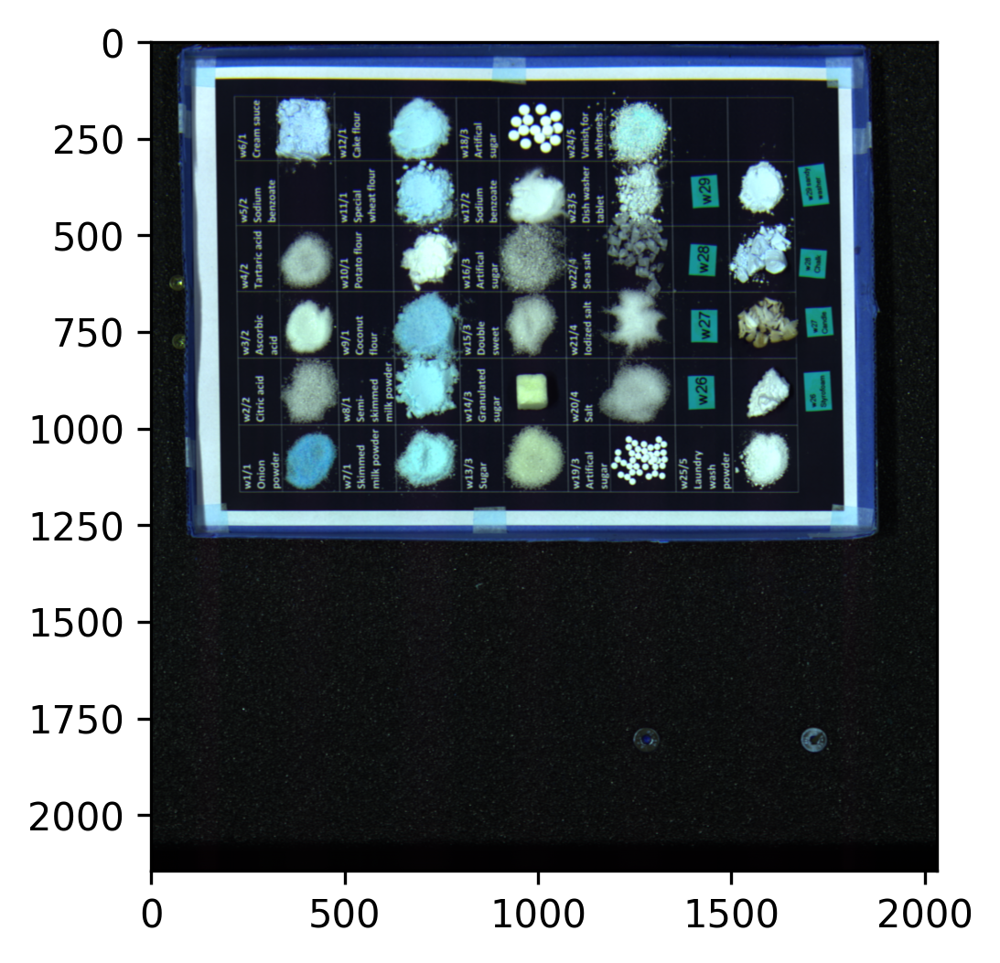

In [9]:
# Show RGB image with new colors!
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
RGB = numpy.empty((lines, samples, 4), dtype=numpy.float32)

# Good 80,160,22 or  90 160 220
ch_1 = 20#90

ch_2 = 40#170

ch_3 = 80#220

ch_4 = 130#220

print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])
print(waves[ch_4])

#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = 1.0*spectral_cube[:,ch_1,:]
RGB[:,:,1] = 1.2*spectral_cube[:,ch_2,:]
RGB[:,:,2] = 1.2*spectral_cube[:,ch_3,:]
RGB[:,:,2] = 1.2*spectral_cube[:,ch_4,:]

plt.rcParams['figure.dpi'] = 300
plt.imshow(numpy.rot90(RGB))

plt.show()

I decided to select 4 channels (wavelengths: 445.52;610.06,722.27,984.73). The last two channels are in the NIR area. In the following we can clearly see, that sugar powders are yellowish, salt is greyish and artificial sugar is totally white. We can also observe that milk and onion powders and, coconut and wheat flour are blueish. All those are eatable an may contain similar substances.

Now lets have a look if we get better results in the IR area. Before we can start, we need to do the white correction. 

In [11]:
# Read hdr
path = "/content/drive/MyDrive/Group5 Session 2/[scanner]/IR-white_powders/capture"

[object_raw, object_hdr, white_raw, white_hdr, dark_raw, dark_hdr ] = readDir(path)
print(object_raw)
samples = 512 
[samples, bands, lines, waves] = read_hdr(object_hdr)

open_path = object_raw
# Read raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
spectral_image = numpy.reshape(raw_image, (lines, bands, samples))
print('spectral_image.shape: ', spectral_image.shape)

/content/drive/MyDrive/Group5 Session 2/[scanner]/IR-white_powders/capture/IR-green_scan_0109.raw
320
320 424 256
45
46
302
spectral_image.shape:  (424, 256, 320)


/content/drive/MyDrive/Group5 Session 2/[scanner]/IR-white_powders/capture/WHITEREF_IR-green_scan_0109.hdr
320
320 223 256
45
46
302
320 256 223


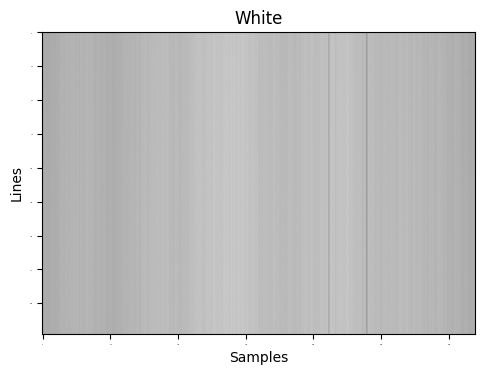

320
320 100 256
45
46
302


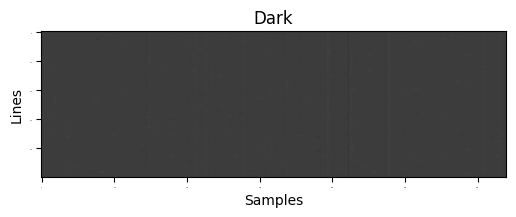

In [16]:
# Read White
print(white_hdr)
[samples, bands, lines, waves] = read_hdr(white_hdr)
print(samples, bands, lines)
open_path = white_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
white_image = numpy.reshape(raw_image, (lines, bands, samples))/lines
plt.rcParams['figure.dpi'] = 100
plt.imshow(white_image[:,100,:], cmap="gray", vmin=0, vmax=85)#
plt.title("White")
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.tick_params(axis='both', which='major', labelsize=1)
plt.show()
###############################################
# Read Dark
[samples, bands, lines, waves] = read_hdr(dark_hdr)
open_path = dark_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
dark_image = numpy.reshape(raw_image, (lines, bands, samples))/lines

plt.rcParams['figure.dpi'] = 100
plt.imshow(dark_image[:,100,:], cmap="gray", vmin=0, vmax=40)#
plt.title("Dark")
plt.tick_params(axis='both', which='major', labelsize=1)
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.show()


In [17]:
# Calculate average for Dark and White

# Spectral_cube = upper_part/lower_part
# upper_part = spectral_image-dark
# lower_part = white - dark

white_av = numpy.sum(white_image, axis = 0) # get average for White
#print(white_image.shape)
#print(white_av.shape)
dark_av = numpy.sum(dark_image, axis = 0) # get average for White
#print(dark_image.shape)
#print(dark_av.shape)

[lines, bansd, samples] = spectral_image.shape
print(spectral_image.shape)
upper_part = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
spectral_cube = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
# Subtract [image - dark]
for i in range(lines):
  upper_part[i,:,:] = numpy.subtract(spectral_image[i,:,:], dark_av) 
# Subtract [white - dark]
lower_part = numpy.subtract(white_av, dark_av) 
# Subtract [image - dark]
for i in range(lines):
  spectral_cube[i,:,:] = numpy.divide(upper_part[i,:,:], lower_part)
# spectral_cube[:,:,:]  a white corrected spectral cube




(424, 256, 320)


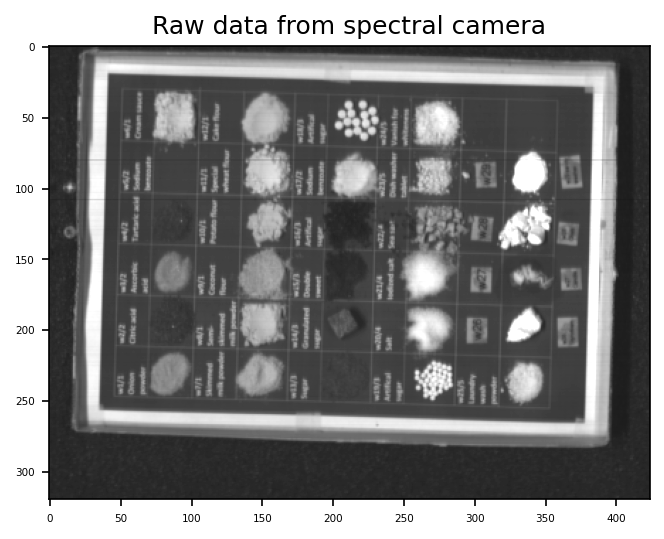

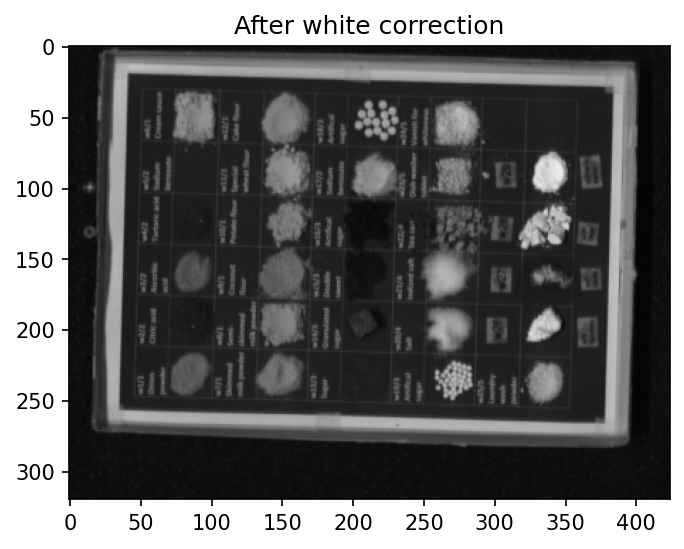

In [19]:
# Plot results before and after white correction
plt.rcParams['figure.dpi'] = 150
plt.imshow(numpy.rot90(spectral_image[:,100,:]), cmap="gray", vmin=0, vmax=10050)#
plt.title("Raw data from spectral camera")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()
plt.imshow(numpy.rot90(spectral_cube[:,100,:]), cmap="gray", vmin=0, vmax= 1)#
plt.title("After white correction")
plt.tick_params(axis='both', which='major', labelsize=10)
plt.show()


1553.5
2057.39
2310.2


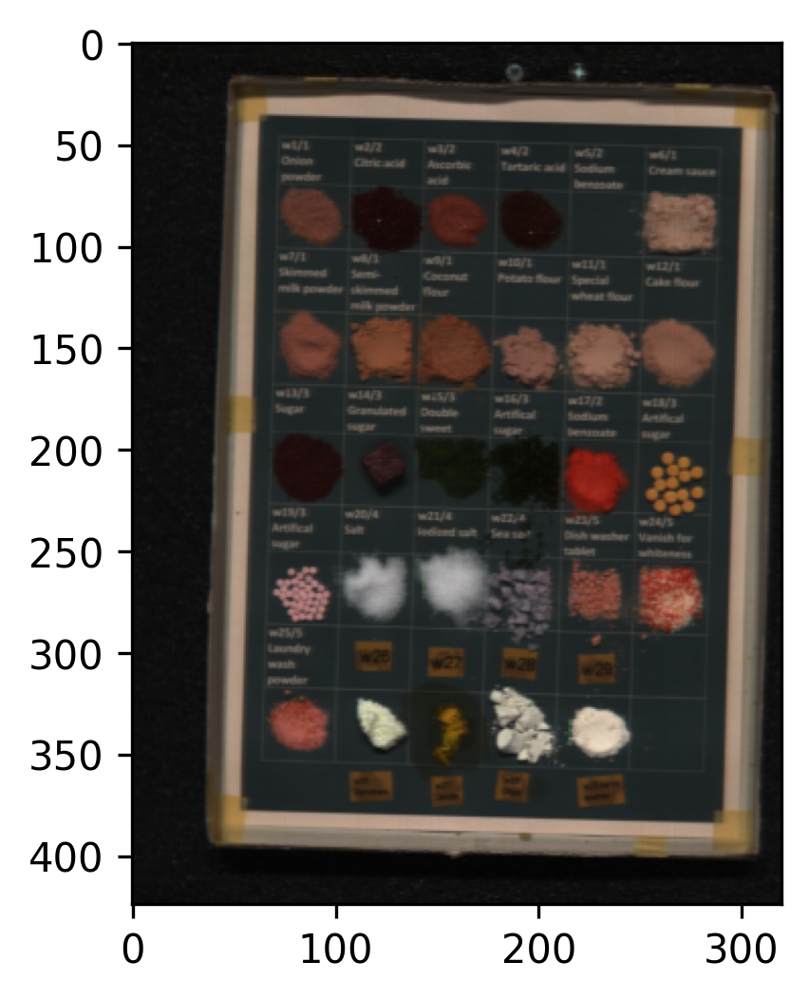

In [24]:
# Show RGB image
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
RGB = numpy.empty((lines, samples, 3), dtype=numpy.float32)
ch_1 = 100
ch_2 = 180
ch_3 = 220
print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])
#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = spectral_cube[:,ch_1,:]
RGB[:,:,1] = spectral_cube[:,ch_2,:]
RGB[:,:,2] = spectral_cube[:,ch_3,:]
plt.rcParams['figure.dpi'] = 300
plt.imshow(RGB)

plt.show()

[0.12665032 0.14582472 0.14568529]


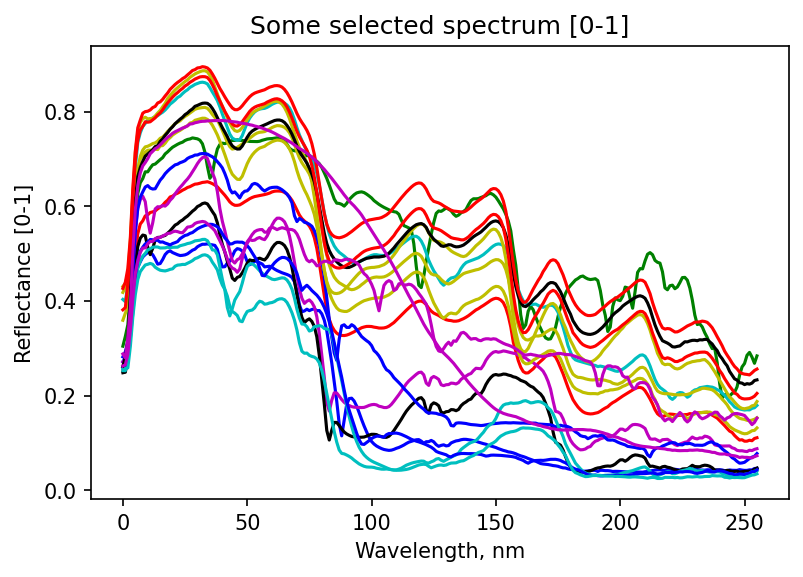

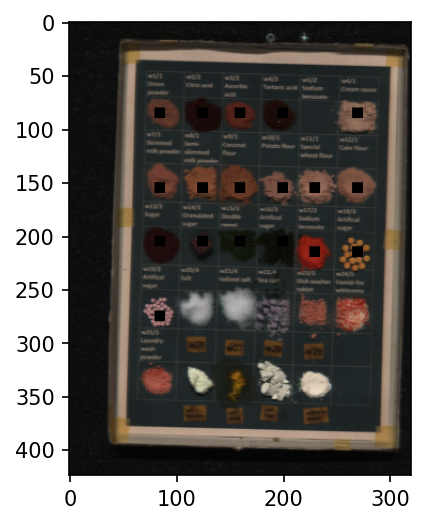

'\n# save \nsaveraw = "/content/drive/My Drive/Colab Notebooks/Temp/green.raw"\nfileobj = open(saveraw, mode=\'wb\')\nselection1.tofile(fileobj)\nfileobj.close()\n'

In [36]:
# Selct area and plot its avearage spectrum
print(RGB[100,100,:])
RGB2 = RGB.copy()
##################################################################
# Select 
x1 = 80
x2 = 90
y1 = 120
y2 = 130
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'b') 
##################################################################
# Select 
x1 = 270
x2 = 280
y1 = 80
y2 = 90
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'g') 
##################################################################
# Select 
x1 = 80
x2 = 90
y1 = 80
y2 = 90
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'r') 
##################################################################
# Select 
x1 = 150
x2 = 160
y1 = 120
y2 = 130 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'c') 
##################################################################
# Select
x1 = 200
x2 = 210
y1 = 120
y2 = 130 
RGB2[x1:x2,y1:y2,0] = 0 # Make RGB black to see selection
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2] # crop spectral cube
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1)) # devide by the number of pixels in selection
plt.plot(selection2, 'm') 
##################################################################

# Select
x1 = 150
x2 = 160
y1 = 80
y2 = 90 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'y') 
##################################################################
# Select 
x1 = 200
x2 = 210
y1 = 80
y2 = 90 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(selection2, 'k') 
##################################################################

# Select 
x1 = 80
x2 = 90
y1 = 155
y2 = 165 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'b') 

##################################################################

# Select 
x1 = 150
x2 = 160
y1 = 155
y2 = 165 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'y') 

##################################################################
# Select 
x1 = 200
x2 = 210
y1 = 155
y2 = 165 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'c') 

##################################################################

# Select 
x1 = 80
x2 = 90
y1 = 195
y2 = 205 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'b') 

##################################################################

# Select 
x1 = 150
x2 = 160
y1 = 195
y2 = 205 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'y') 

##################################################################
# Select 
x1 = 200
x2 = 210
y1 = 195
y2 = 205 
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'c') 

# Select 
x1 = 80
x2 = 90
y1 = 265
y2 = 275  
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'k') 

##################################################################

# Select 
x1 = 150
x2 = 160
y1 = 265
y2 = 275  
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'r') 

##################################################################
# Select 
x1 = 210
x2 = 220
y1 = 265
y2 = 275  
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'm') 

##################################################################

# Select 
x1 = 150
x2 = 160
y1 = 225
y2 = 235  
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'r') 

##################################################################
# Select 
x1 = 210
x2 = 220
y1 = 225
y2 = 235  
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'm')

plt.title("Some selected spectrum [0-1]")
plt.tick_params(axis='both', which='major', labelsize=10)
plt.xlabel('Wavelength, nm')
plt.ylabel('Reflectance [0-1]')
plt.show()


### Show RGB previes #############################################
plt.rcParams['figure.dpi'] = 150
plt.imshow(RGB2)
plt.show()


'''
# save 
saveraw = "/content/drive/My Drive/Colab Notebooks/Temp/green.raw"
fileobj = open(saveraw, mode='wb')
selection1.tofile(fileobj)
fileobj.close()
'''


Here, we can clearly observe that the spectra distributions of the white powders in the IR-are are easy to distinguish. Therefore it will be easier to seperate each powder.

1490.44
1931.35
2310.2


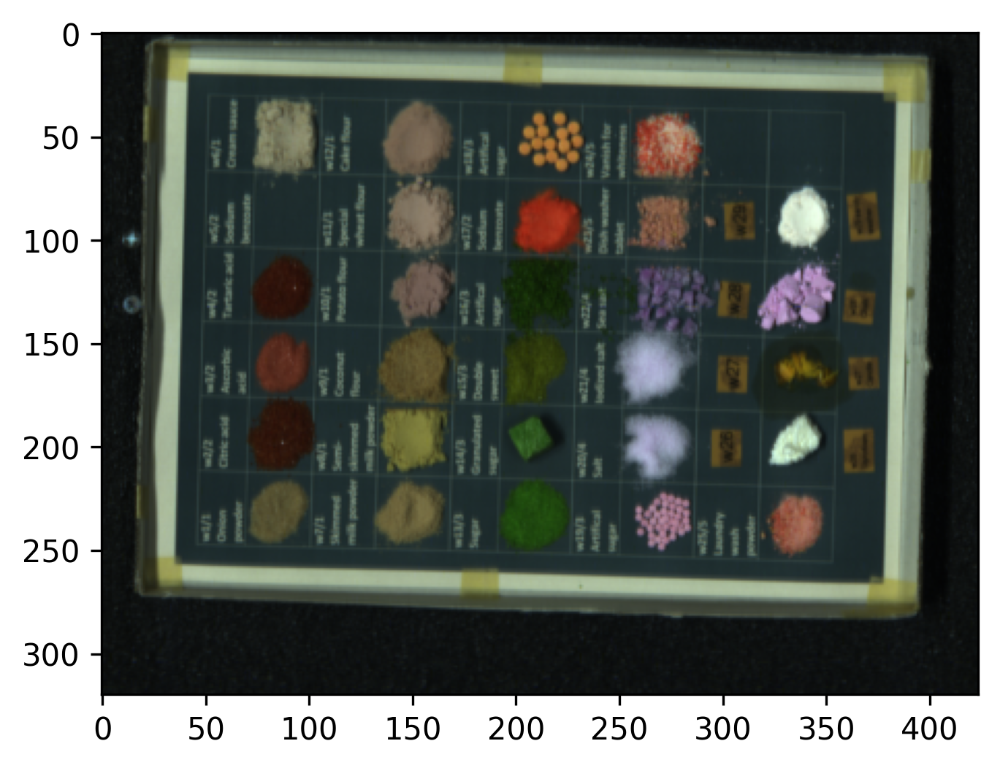

In [37]:
# Show RGB image with new colors!
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
RGB = numpy.empty((lines, samples, 3), dtype=numpy.float32)

# Good 80,160,22 or  90 160 220
ch_1 = 90#90

ch_2 = 160#170

ch_3 = 220#220



print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])
#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = 1.0*spectral_cube[:,ch_1,:]
RGB[:,:,1] = 1.2*spectral_cube[:,ch_2,:]
RGB[:,:,2] = 1.2*spectral_cube[:,ch_3,:]
plt.rcParams['figure.dpi'] = 300
plt.imshow(numpy.rot90(RGB))

plt.show()

I selected just 3 important wavelenghts 1490.44, 1931.35, 2310.2 and we have clearly seperated substances from each other. 

Last I will try the segmentation from Task 1 and the the separation we have done just now, for the IR plastic green leaves. Again, we need to do the white correction first. 

In [38]:
# Read hdr
path = "/content/drive/MyDrive/Group3 session 2/[scanner]/IR-green_leaves/capture"

[object_raw, object_hdr, white_raw, white_hdr, dark_raw, dark_hdr ] = readDir(path)
print(object_raw)
samples = 512 
[samples, bands, lines, waves] = read_hdr(object_hdr)

open_path = object_raw
# Read raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
spectral_image = numpy.reshape(raw_image, (lines, bands, samples))
print('spectral_image.shape: ', spectral_image.shape)

/content/drive/MyDrive/Group3 session 2/[scanner]/IR-green_leaves/capture/IR-green_scan_0075.raw
320
320 590 256
45
46
302
spectral_image.shape:  (590, 256, 320)


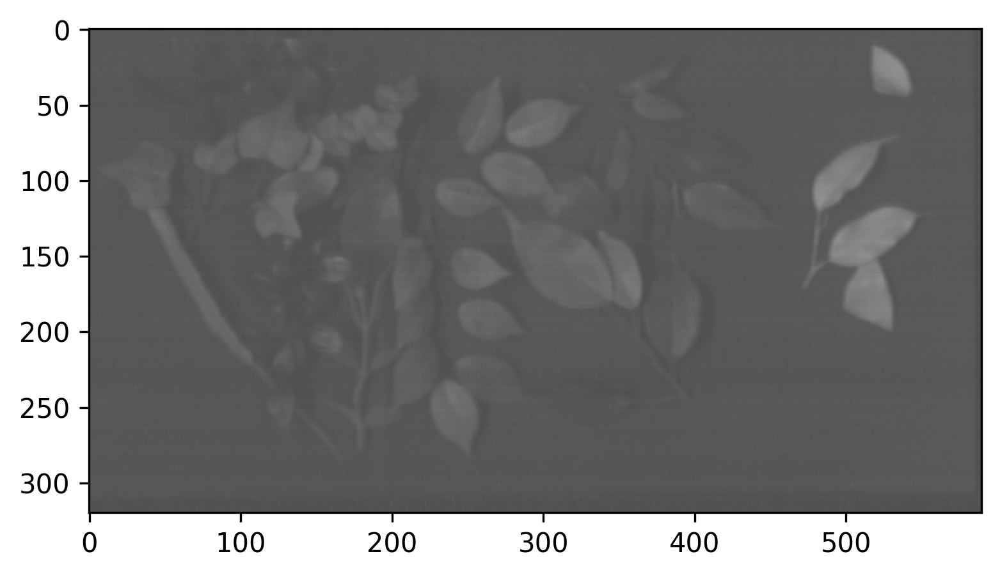

In [39]:
# Plot picture and spectrum

plt.rcParams['figure.dpi'] = 300

#fig.suptitle('Spectral cube slice and single spectrum')
img = spectral_image[:,20,:]
# pale with selected band and vmax=4700
plt.imshow(numpy.rot90(img), cmap="gray", vmin=0, vmax=3700)#
plt.show()


/content/drive/MyDrive/Group3 session 2/[scanner]/IR-green_leaves/capture/WHITEREF_IR-green_scan_0075.hdr
320
320 297 256
45
46
302
320 256 297


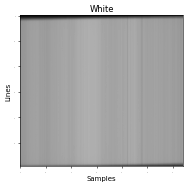

320
320 100 256
45
46
302


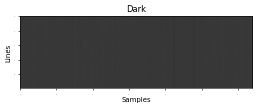

In [41]:
# Read White
print(white_hdr)
[samples, bands, lines, waves] = read_hdr(white_hdr)
print(samples, bands, lines)
open_path = white_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
white_image = numpy.reshape(raw_image, (lines, bands, samples))/lines
plt.rcParams['figure.dpi'] = 50
plt.imshow(white_image[:,100,:], cmap="gray", vmin=0, vmax=80)#
plt.title("White")
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.tick_params(axis='both', which='major', labelsize=1)
plt.show()
###############################################
# Read Dark
[samples, bands, lines, waves] = read_hdr(dark_hdr)
open_path = dark_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
dark_image = numpy.reshape(raw_image, (lines, bands, samples))/lines

plt.rcParams['figure.dpi'] = 50
plt.imshow(dark_image[:,100,:], cmap="gray", vmin=0, vmax=50)#
plt.title("Dark")
plt.tick_params(axis='both', which='major', labelsize=1)
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.show()


In [42]:
# Calculate average for Dark and White

# Spectral_cube = upper_part/lower_part
# upper_part = spectral_image-dark
# lower_part = white - dark

white_av = numpy.sum(white_image, axis = 0) # get average for White
#print(white_image.shape)
#print(white_av.shape)
dark_av = numpy.sum(dark_image, axis = 0) # get average for White
#print(dark_image.shape)
#print(dark_av.shape)

[lines, bansd, samples] = spectral_image.shape
print(spectral_image.shape)
upper_part = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
spectral_cube = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
# Subtract [image - dark]
for i in range(lines):
  upper_part[i,:,:] = numpy.subtract(spectral_image[i,:,:], dark_av) 
# Subtract [white - dark]
lower_part = numpy.subtract(white_av, dark_av) 
# Subtract [image - dark]
for i in range(lines):
  spectral_cube[i,:,:] = numpy.divide(upper_part[i,:,:], lower_part)
# spectral_cube[:,:,:]  a white corrected spectral cube




(590, 256, 320)


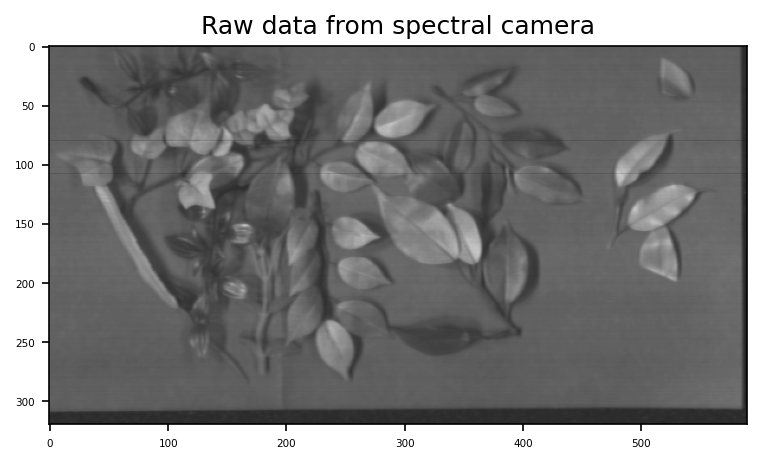

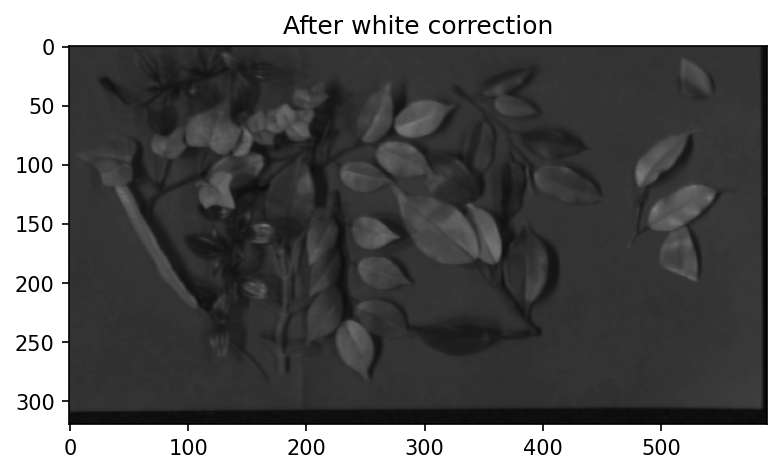

In [43]:
# Plot results before and after white correction
plt.rcParams['figure.dpi'] = 150
plt.imshow(numpy.rot90(spectral_image[:,100,:]), cmap="gray", vmin=0, vmax=10050)#
plt.title("Raw data from spectral camera")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()
plt.imshow(numpy.rot90(spectral_cube[:,100,:]), cmap="gray", vmin=0, vmax= 1)#
plt.title("After white correction")
plt.tick_params(axis='both', which='major', labelsize=10)
plt.show()


1553.5
2057.39
2310.2


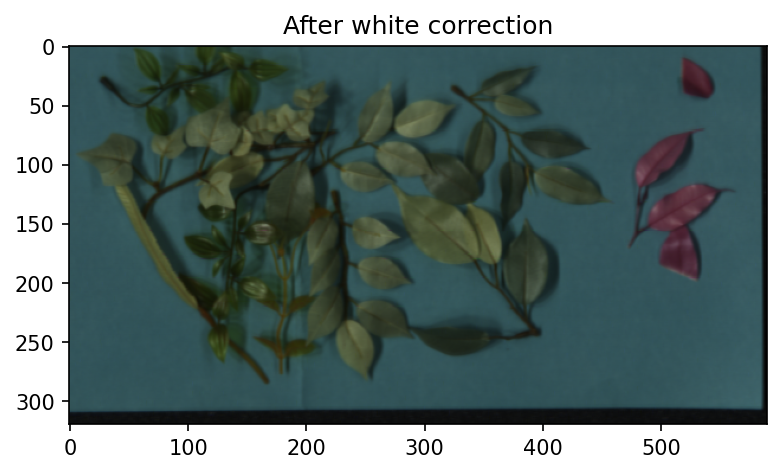

In [44]:
# Show RGB image
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
RGB = numpy.empty((lines, samples, 3), dtype=numpy.float32)
ch_1 = 100
ch_2 = 180
ch_3 = 220
print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])
#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = spectral_cube[:,ch_1,:]
RGB[:,:,1] = spectral_cube[:,ch_2,:]
RGB[:,:,2] = spectral_cube[:,ch_3,:]
plt.title("After white correction")
plt.rcParams['figure.dpi'] = 300
plt.imshow(numpy.rot90(RGB))

plt.show()

In [46]:
RGBgreenLeaves = RGB.copy()
RGBgreenLeaves2 = RGB.copy()

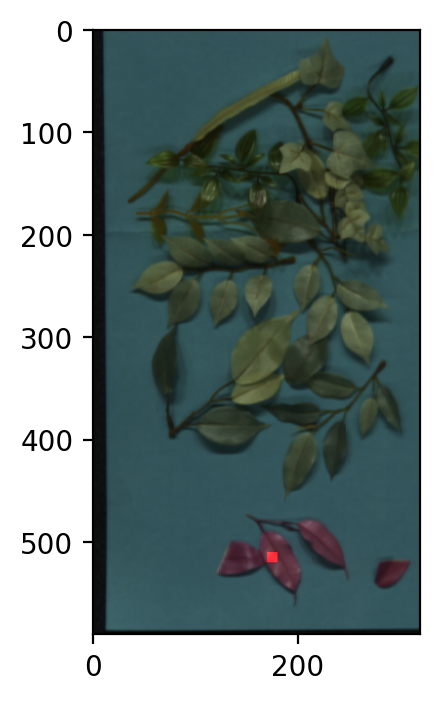

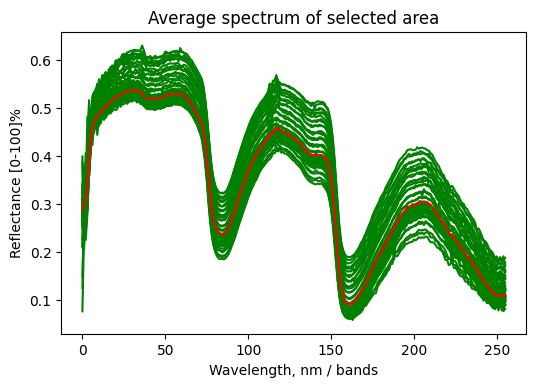

In [50]:
# Selct area and plot its avearage spectrum
##################################################################

# S
x1 = 510
x2 = 520
y1 = 170
y2 = 180

plt.rcParams['figure.dpi'] = 200

RGBgreenLeaves[x1:x2,y1:y2,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
#print(spectral_cube.shape)
#print(plastic.shape)

sel1 = numpy.sum(sel, axis = 0)
#print(pl1.shape)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
#print(pl2.shape)

##################################################################

plt.imshow(RGBgreenLeaves)
plt.rcParams['figure.dpi'] = 100
plt.show()

for i in range(5):
  plt.plot(sel[i,:,], 'g') #plt.plot(waves,selection1)

plt.plot(selection1, 'r') #plt.plot(waves,selection1)
plt.xlabel('Wavelength, nm / bands')
plt.ylabel('Reflectance [0-100]%')
plt.title("Average spectrum of selected area")


plt.show()

# save 
saveraw = "/content/drive/MyDrive/savedata/green_leaves_image0001.raw"
fileobj = open(saveraw, mode='wb')
selection1.tofile(fileobj)
fileobj.close()


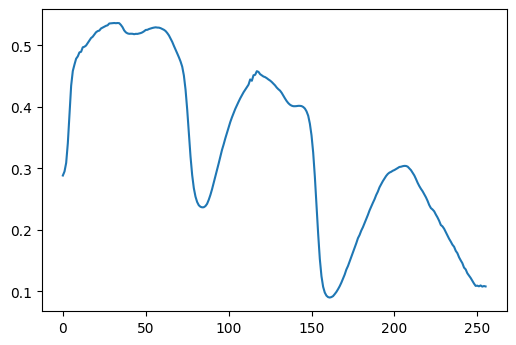

In [51]:
open_path = "/content/drive/MyDrive/savedata/green_leaves_image0001.raw"
fopen = open(open_path, "rb")
mushroom = numpy.fromfile(fopen, dtype=numpy.float32) 
fopen.close()
plt.plot(mushroom)
plt.show()

590 256 320
20
50
160
200
RGB:  (590, 320, 3)
cube:  (590, 256, 320)
small cube:  (590, 320, 4)


0.6174612
0.48419702
0.5134436


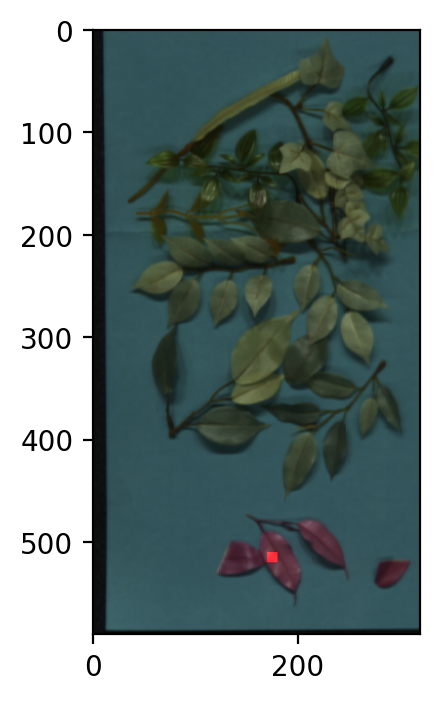

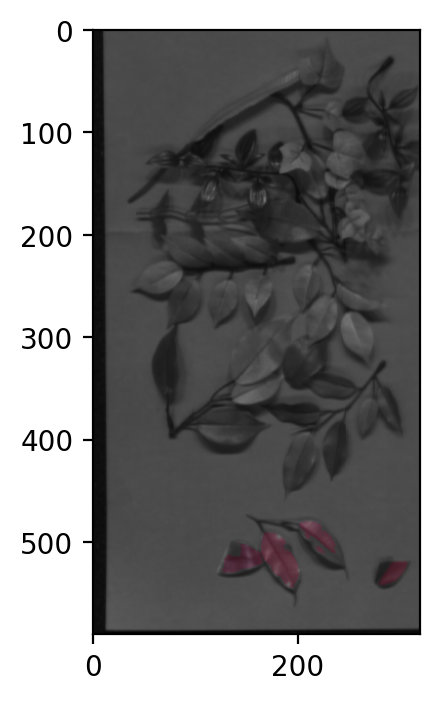

In [53]:
# Generate Band based condition
n = 4 # the number of important bnds
bbands = numpy.empty(n, dtype=numpy.uint16) # array size of number of important bands
# we select the importqant bands:
bbands[0] = 20
bbands[1] = 50
bbands[2] = 160
bbands[3] = 200

# Read selected spectrum, ploted and saved in prevous code section 
open_path = "/content/drive/MyDrive/savedata/green_leaves_image0001.raw"
fopen = open(open_path, "rb")
selected = numpy.fromfile(fopen, dtype=numpy.float32) 
fopen.close()
###################################################################################################
# ratio is an array of ratios: ratio[n]=selcted[bbands[n+1]]/selected[bbands[n]]
ratio = numpy.zeros(n-1) # array of ratios: ratio[n]=selcted[bbands[n+1]]/selected[bbands[n]]
for i in range(n-1):
  ratio[i] = selected[bbands[i]]
###################################################################################################
# now we make a new 'small_spectral_cube' made of selected bands from 'spectral_cube'
[s1, s2, s3] = spectral_cube.shape
print(s1, s2, s3)
small_spectral_cube = numpy.empty((lines, samples, n), dtype=numpy.float32)
i=0
for band in bbands:
  small_spectral_cube[:,:,i] = spectral_cube[:,band,:]
  print(band)
  i=i+1
print('RGB: ', RGB.shape)
print('cube: ', spectral_cube.shape)
print('small cube: ', small_spectral_cube.shape)

###################################################################################################
mask = RGB.copy()

for i in range(0,s1):  #s1
  for j in range(0,s3): #s3
    criteria = 0
    for ch in range(n-1):
      #mask[i,j,0]=1
      if numpy.abs((small_spectral_cube[i,j,ch]-ratio[ch]))>0.1: #[0.02 - 0.18] threshold
        criteria = 1
        # ´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´
        gray_color = (mask[i,j,0] + mask[i,j,1] + mask[i,j,2])/3 # make mask gray scale and only selection RGB
        mask[i,j,0]=gray_color
        mask[i,j,1]=gray_color
        mask[i,j,2]=gray_color                       
        # ´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´
    if criteria == 0:
      pass

print(numpy.amax(small_spectral_cube))
print(numpy.amax(mask))
print(numpy.amax(RGB))
###################################################################################################
plt.rcParams['figure.dpi'] = 200
plt.imshow(RGBgreenLeaves)

plt.show()
plt.rcParams['figure.dpi'] = 200

plt.show()
plt.imshow(mask)


We clearly segmented the real leaves in the picture using a mask. 

Lets try to seperate them by choosing relevant Channels. Therefore, I will first plot the spectras of some leaves 

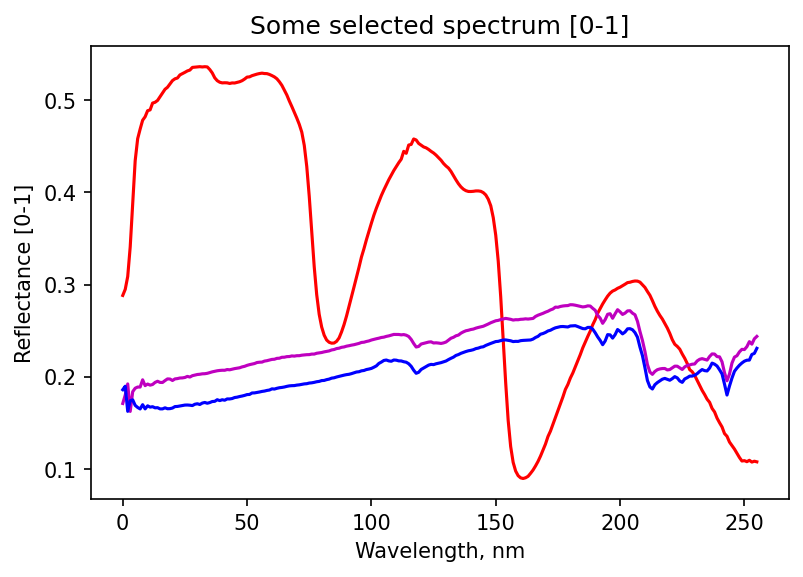

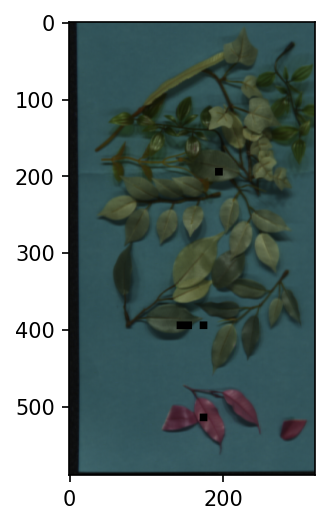

In [56]:
# Select 
x1 = 510
x2 = 520
y1 = 170
y2 = 180 
RGBgreenLeaves2[x1:x2,y1:y2,0] = 0
RGBgreenLeaves2[x1:x2,y1:y2,1] = 0
RGBgreenLeaves2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'r') 

##################################################################
# Select 
x1 = 190
x2 = 200
y1 = 190
y2 = 200  
RGBgreenLeaves2[x1:x2,y1:y2,0] = 0
RGBgreenLeaves2[x1:x2,y1:y2,1] = 0
RGBgreenLeaves2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'm')

##################################################################
# Select 
x1 = 390
x2 = 400
y1 = 140
y2 = 150  
RGBgreenLeaves2[x1:x2,y1:y2,0] = 0
RGBgreenLeaves2[x1:x2,y1:y2,1] = 0
RGBgreenLeaves2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'b')

plt.title("Some selected spectrum [0-1]")
plt.tick_params(axis='both', which='major', labelsize=10)
plt.xlabel('Wavelength, nm')
plt.ylabel('Reflectance [0-1]')
plt.show()


### Show RGB previes #############################################
plt.rcParams['figure.dpi'] = 150
plt.imshow(RGBgreenLeaves2)
plt.show()


As expacted, if we select severals leaves, we can find two different distributions (for plastic and for real leaves). All the other leaves spectra match to on of them, as they are of the same struture. Next, I will select important channels.

1490.44
1679.5
1931.35


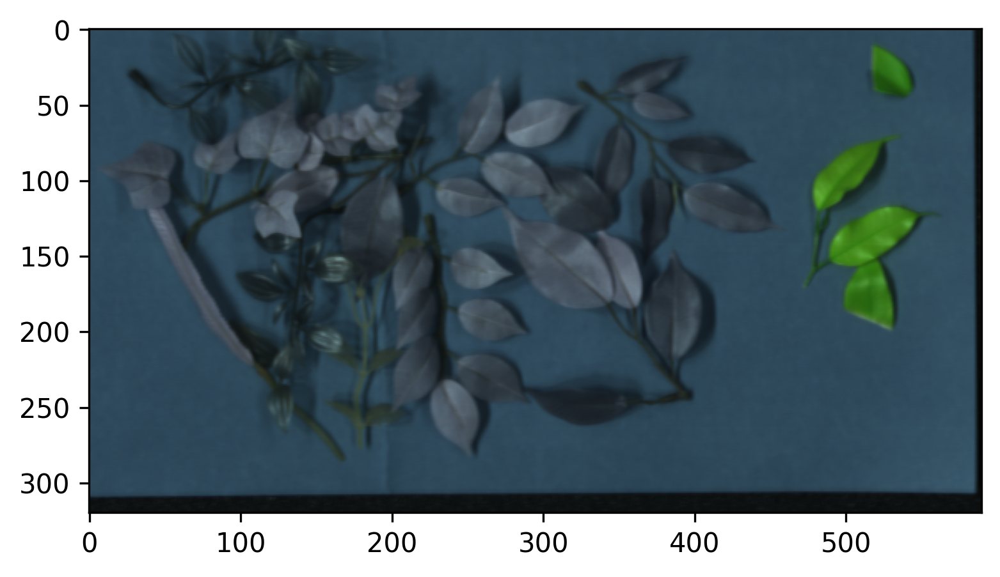

In [57]:
# Show RGB image with new colors!
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
RGB = numpy.empty((lines, samples, 3), dtype=numpy.float32)

# Good 80,160,22 or  90 160 220
ch_1 = 90#90

ch_2 = 120#170

ch_3 = 160#220



print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])
#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = 1.0*spectral_cube[:,ch_1,:]
RGB[:,:,1] = 1.2*spectral_cube[:,ch_2,:]
RGB[:,:,2] = 1.2*spectral_cube[:,ch_3,:]
plt.rcParams['figure.dpi'] = 300
plt.imshow(numpy.rot90(RGB))

plt.show()

As expected, we can cleary differentiate between two kind of leaves. If we look at the plastic leaves on the left, they are also two kind of slightly different colors. That means if we look very carefully we can differentiate among 3 different kind of leaves. 